# Gulf Coast Weather Prediction
### Cleaning and Visualizing the Gulf Coast Area's Weather Patterns between 2010 - 2019

Our livelihoods are so greatly affected by the weather. Depending on the region someone lives in usually determines the type of weather patterns that they will see on a yearly, monthly or even daily basis. A large majority of industries greatly depend on their region’s weather and climate. For instance, farmers need a good mixture of rain and sunlight so that their crops may grow. Too much sun but not enough rain, may cause issues to their crop yields. Just as too much rain and not enough sun can affect their crop yields as well. Seasonal temperatures factor in as well, as a majority of crops grow based on the daily temperatures. Some may grow better in months that are typically known to have cooler temperatures, while other crops prefer to grow in the warmer months.

History is known to repeat itself on certain occasions but predicting when history will repeat itself, or if it ever will, is an ongoing issue. The best approach is look for patterns of the past while comparing it to patterns of the present. Weather has shown signs of yearly and seasonal patterns but it’s not always set in stone. Just like other factors in our world, weather patterns are changing as well. Global warming has become a hot debate in our culture today as more and more people feel that the certain factors in our environments are raising temperatures around the world which in turn are also raising the temperatures of our oceans, seas and Gulfs. This project isn’t necessarily a global warming, project, but as we go through our historical weather data and try to predict future weather patterns, we will be able to see if there has been a general uptick in temps and see if there is a correlation with any effects it’s having on our data over the years.

Our data is from https://www.ncdc.noaa.gov/ and consists of 5 different datasets for each of our chosen cities. Each one consists of daily weather information for each city saved as a CSV file.

#### Cities used for our datasets
    -New Orleans = New Orleans Airport (New_Orleans.csv)
    -Pascagoula = Pascagoula Lott International Airport (Pascagoula.csv)
    -Houston International Airport (Houston.csv)
    -Mobile = Mobile Downtown Airport (Mobile.csv)
    -Tampa = Tampa International Airport (Tampa.csv)

### Terms and definitions

Dewpoint Average Temperature - temperature where water vapor starts to condense out of the air (the temperature at which air becomes completely saturated). Above this temperature the moisture stays in the air.
                        If the dew-point temperature is close to the dry air temperature -  the relative humidity is high
                        If the dew point is well below the dry air temperature - the relative humidity is low

Humidity(%)- concentration of water vapor present in the air. Water vapor, the gaseous state of water. Humidity indicates the likelihood for precipitation, dew, or fog to be present. The amount of water vapor needed to achieve saturation increases as the temperature increases.

Sealevel_pressure(Hg)- atmospheric pressure at sea level at a given location. When observed at a reporting station that is not at sea level (nearly all stations), it is a correction of the station pressure to sea level. This correction takes into account the standard variation of pressure with height and the influence of temperature variations with height on the pressure. The temperature used in the sea level correction is a twelve hour mean, eliminating diurnal effects.


## Data Cleaning - Importing packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime

In [2]:
#import seaborn and set parameters
import seaborn as sns
sns.set_style('darkgrid')
sns.set_context('talk')
plt.style.use('fivethirtyeight') # For plots

#import visualizations
import joypy
from matplotlib import cm
import plotly
import plotly_express as px
import plotly.graph_objects as go

In [3]:
import statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import t
from scipy import stats

In [4]:
# import warnings filter
from warnings import simplefilter

# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')

In [5]:
import warnings
#warnings.simplefilter("ignore", UserWarning)

In [6]:
# Import necessary modules
import glob

# Write the pattern: pattern 
pattern = '*.csv' 

# Save all file matches: csv_files
csv_files = glob.glob(pattern) 

# Create an empty list: frames
frames = [] 

# Iterate over csv_files 
for csv in csv_files: 
    # Read csv into a DataFrame: df 
    df = pd.read_csv(csv) 
    # Append df to frames 
    frames.append(df)

    # Concatenate frames into a single DataFrame: final_df
df = pd.concat(frames)

C:\Users\Jimsyd\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning:

Columns (31,34,41,42,43,46,48,49,51,53,56,58,59,75,76,89) have mixed types.Specify dtype option on import or set low_memory=False.

C:\Users\Jimsyd\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning:

Columns (3,25,26,27,35,36,41,51,53,56,58,59,60,61,63,95,108,114,117,119) have mixed types.Specify dtype option on import or set low_memory=False.

C:\Users\Jimsyd\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning:

Columns (30,31,41,42,43,46,49,51) have mixed types.Specify dtype option on import or set low_memory=False.

C:\Users\Jimsyd\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning:

Columns (41,42,49,51,69,88) have mixed types.Specify dtype option on import or set low_memory=False.

C:\Users\Jimsyd\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning:

Columns (34,41,42,43,

## Data Cleaning and Exploratory Data Analysis (EDA)

We'll 1st take a look at our dataset to get an idea of what we're working with and what steps we need to take to clean our dataframe and prepare it for the rest of our project. 

Our cleaning will consist of dropping unnecessary columns as well as dropping any rows that aren't providing us the information that we're looking for. Find null values and deal with them properly.

In [7]:
#show first 5 rows
df.head()

,City,datetime,Dewpoint_temp(°F),Humidity(%),Sealevel_pressure(Hg),Max_temp(°F),Min_temp(°F),Average_temp(°F),Wind_speed(mph),Rainfall(in),...,ShortDurationPrecipitationValue120,ShortDurationPrecipitationValue150,ShortDurationPrecipitationValue180,Sunrise,Sunset,TStorms,WindEquipmentChangeDate,DailyDewPoint,DailyRelativeHumidity,DeailySeaLevelPressure
0,Houston,2010-01-01,35.0,65.0,30.40,56.0,38.0,47.0,26.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Houston,2010-01-02,32.0,66.0,30.33,56.0,31.0,44.0,15.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Houston,2010-01-03,35.0,72.0,30.26,49.0,37.0,43.0,14.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Houston,2010-01-04,29.0,62.0,30.41,48.0,34.0,41.0,25.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Houston,2010-01-05,26.0,65.0,30.43,50.0,28.0,39.0,18.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
#list all column names
list(df.keys())

['City',
 'datetime',
 'Dewpoint_temp(°F)',
 'Humidity(%)',
 'Sealevel_pressure(Hg)',
 'Max_temp(°F)',
 'Min_temp(°F)',
 'Average_temp(°F)',
 'Wind_speed(mph)',
 'Rainfall(in)',
 'Rain or Not',
 'Day',
 'Week',
 'Month_Name',
 'Year',
 'STATION',
 'REPORT_TYPE',
 'SOURCE',
 'AWND',
 'BackupDirection',
 'BackupDistance',
 'BackupDistanceUnit',
 'BackupElements',
 'BackupElevation',
 'BackupElevationUnit',
 'BackupEquipment',
 'BackupLatitude',
 'BackupLongitude',
 'BackupName',
 'CDSD',
 'CLDD',
 'DSNW',
 'DailyAverageDewPointTemperature',
 'DailyAverageDryBulbTemperature',
 'DailyAverageRelativeHumidity',
 'DailyAverageSeaLevelPressure',
 'DailyAverageStationPressure',
 'DailyAverageWetBulbTemperature',
 'DailyAverageWindSpeed',
 'DailyCoolingDegreeDays',
 'DailyDepartureFromNormalAverageTemperature',
 'DailyHeatingDegreeDays',
 'DailyMaximumDryBulbTemperature',
 'DailyMinimumDryBulbTemperature',
 'DailyPeakWindDirection',
 'DailyPeakWindSpeed',
 'DailyPrecipitation',
 'DailySnowDepth'

In [9]:
#get number of rows and columns
df.shape

(699929, 141)

In [10]:
#additional info about dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 699929 entries, 0 to 135984
Columns: 141 entries, City to DeailySeaLevelPressure
dtypes: float64(75), object(66)
memory usage: 758.3+ MB


In [11]:
#statistical description, only for numeric values
df.describe()

,Dewpoint_temp(°F),Humidity(%),Sealevel_pressure(Hg),Max_temp(°F),Min_temp(°F),Average_temp(°F),Wind_speed(mph),Rainfall(in),Rain or Not,Day,...,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue150,Sunrise,Sunset,TStorms,DailyDewPoint,DailyRelativeHumidity,DeailySeaLevelPressure
count,54729.000000,54729.000000,54729.000000,54729.000000,54729.000000,54729.000000,54729.000000,54729.000000,18243.000000,18243.000000,...,535.000000,535.000000,535.000000,535.000000,18243.000000,18243.000000,0.0,119872.000000,119872.000000,119969.000000
mean,60.499926,73.628929,30.049150,79.980266,61.407170,70.944581,22.768459,0.159897,0.312175,15.714795,...,0.945196,1.131140,1.202056,1.318542,584.181878,1801.341227,NaN,60.949764,79.421171,30.054904
std,13.934575,11.397269,0.140396,12.198478,14.031103,12.746456,6.947008,0.523263,0.463393,8.792617,...,0.608570,0.746828,0.803310,0.879588,71.216328,74.977100,NaN,14.019383,11.781612,0.140518
min,4.708333,21.000000,29.440000,31.000000,16.000000,26.000000,0.000000,0.000000,0.000000,1.000000,...,0.010000,0.010000,0.010000,0.010000,449.000000,1651.000000,NaN,4.708333,34.240000,29.464167
25%,52.000000,67.000000,29.960000,72.000000,51.000000,62.000000,18.000000,0.000000,0.000000,8.000000,...,0.480000,0.570000,0.610000,0.695000,529.000000,1736.000000,NaN,52.958333,72.680000,29.970000
50%,64.500000,75.000000,30.035833,82.000000,65.000000,74.000000,22.000000,0.000000,0.000000,16.000000,...,0.840000,0.990000,1.060000,1.170000,601.000000,1816.000000,NaN,64.640000,81.200000,30.043750
75%,72.000000,82.000000,30.130000,90.000000,74.000000,82.000000,26.000000,0.030000,1.000000,23.000000,...,1.270000,1.530000,1.605000,1.760000,639.000000,1852.000000,NaN,72.560000,88.514286,30.136250
max,80.000000,100.000000,30.695417,109.000000,85.000000,95.000000,120.000000,16.070000,1.000000,31.000000,...,3.920000,5.660000,6.170000,7.180000,723.000000,1931.000000,NaN,79.833333,99.875000,30.695417


In [12]:
#Convert string DATE into readable datetime object
df['datetime'] = pd.to_datetime(df['datetime'])

In [13]:
#create dataframe with columns that we'll be using
df = df[['STATION',
         'datetime',
         'REPORT_TYPE',
         'DailyDewPoint',
         'DailyRelativeHumidity',
         'DeailySeaLevelPressure',
         'DailyAverageDewPointTemperature',
         'DailyAverageRelativeHumidity',
         'DailyAverageSeaLevelPressure',
         'DailyMaximumDryBulbTemperature',
         'DailyMinimumDryBulbTemperature',
         'DailyAverageDryBulbTemperature',
         'DailyPeakWindSpeed',
         'DailyPrecipitation'
        ]]

In [14]:
#Clean up our column names. DA = Daily Average. Temps are in 
df = df.rename(columns = {'STATION':'City',
                          'DATE': 'Date',
                          'REPORT_TYPE': 'Report_type',
                          'DailyAverageDewPointTemperature':'Dewpoint_temp(°F)',
                          'DailyAverageDryBulbTemperature': 'Average_temp(°F)',
                          'DailyAverageRelativeHumidity': 'Humidity(%)',
                          'DailyAverageSeaLevelPressure': 'Sealevel_pressure(Hg)',
                          'DailyMaximumDryBulbTemperature': 'Max_temp(°F)',
                          'DailyMinimumDryBulbTemperature': 'Min_temp(°F)',
                          'DailyPeakWindSpeed': 'Wind_speed(mph)',
                          'DailyPrecipitation': 'Rainfall(in)'})

In [15]:
#To make things easier to follow we'll replace the Station IDs with the name of their corresponding cities
df = df.replace({'City': {72231012916:'New_Orleans', 72223513838:'Mobile', 72243012960:'Houston', 74768853858:'Pascagoula', 72211012842:'Tampa'}})
df

,City,datetime,Report_type,DailyDewPoint,DailyRelativeHumidity,DeailySeaLevelPressure,Dewpoint_temp(°F),Humidity(%),Sealevel_pressure(Hg),Max_temp(°F),Min_temp(°F),Average_temp(°F),Wind_speed(mph),Rainfall(in)
0,NaN,2010-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,2010-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,2010-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,2010-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,2010-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135980,Tampa,2019-12-31,FM-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
135981,Tampa,2019-12-31,FM-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
135982,Tampa,2019-12-31,FM-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
135983,Tampa,2019-12-31,SOD,NaN,NaN,NaN,46.0,57.0,30.08,71.0,56.0,64.0,17,0.00


,Total,Percent
Dewpoint_temp(°F),685672,97.963079
Sealevel_pressure(Hg),685669,97.962650
Humidity(%),685595,97.952078
Wind_speed(mph),681783,97.407451
Rainfall(in),681713,97.397450
Average_temp(°F),681712,97.397307
Min_temp(°F),681711,97.397165
Max_temp(°F),681710,97.397022
DailyRelativeHumidity,580057,82.873691
DailyDewPoint,580057,82.873691


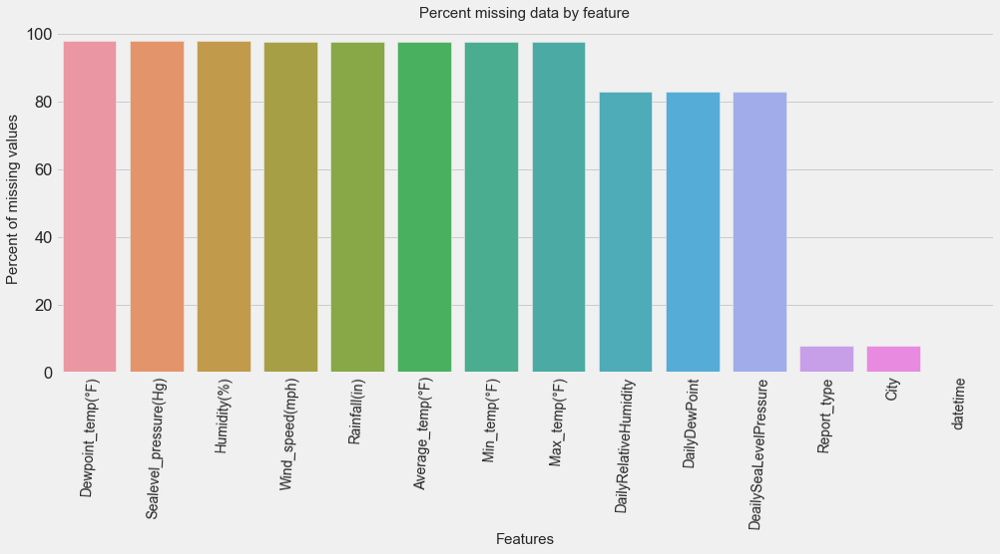

In [16]:
#check the null values 
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count() * 100).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

#show visual results of missing data
f, ax = plt.subplots(figsize=(15, 6))
plt.xticks(rotation='87', fontsize=14)
sns.barplot(x=missing_data.index, y=missing_data['Percent'])
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of missing values', fontsize=15)
plt.title('Percent missing data by feature', fontsize=15)

missing_data

In [17]:
#count unique values in a column
df['Rainfall(in)'].value_counts(dropna=False)

NaN     681713
0.00      8598
0.0       2345
T         1584
0.01       393
         ...  
3.98         1
2.05         1
3.8          1
2.43         1
2.40         1
Name: Rainfall(in), Length: 551, dtype: int64

In [18]:
#our datasets came with it's own filter so that we can easily seperate the rows that have the daily data that we'll focus on
#First we have to make sure that we'll be able to filter the variable properly by making sure the values are listed correctly
list(df['Report_type'].unique())

[nan, 'FM-12', 'FM-15', 'FM-16', 'SOD  ', 'SOM  ', 'SY-MT', 'AUTO ']

In [19]:
#we see that SOD has a space added at the end so we'll take that out before filter our data set
df['Report_type'] = df['Report_type'].replace('SOD  ', 'SOD')

In [20]:
#Now we can sort our dataframe by the rows that contain only data consisting of daily averages SOD = Statistics of Day
df = df.loc[df['Report_type'] == 'SOD']
df

,City,datetime,Report_type,DailyDewPoint,DailyRelativeHumidity,DeailySeaLevelPressure,Dewpoint_temp(°F),Humidity(%),Sealevel_pressure(Hg),Max_temp(°F),Min_temp(°F),Average_temp(°F),Wind_speed(mph),Rainfall(in)
30,Houston,2010-01-01,SOD,NaN,NaN,NaN,35.0,65.0,30.40,56.0,38.0,47.0,26,0.00
59,Houston,2010-01-02,SOD,NaN,NaN,NaN,32.0,66.0,30.33,56.0,31.0,44.0,15,0.00
88,Houston,2010-01-03,SOD,NaN,NaN,NaN,35.0,72.0,30.26,49.0,37.0,43.0,14,T
119,Houston,2010-01-04,SOD,NaN,NaN,NaN,29.0,62.0,30.41,48.0,34.0,41.0,25,0.00
148,Houston,2010-01-05,SOD,NaN,NaN,NaN,26.0,65.0,30.43,50.0,28.0,39.0,18,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135795,Tampa,2019-12-27,SOD,NaN,NaN,NaN,65.0,78.0,30.10,77.0,67.0,72.0,23,T
135847,Tampa,2019-12-28,SOD,NaN,NaN,NaN,67.0,80.0,30.05,80.0,69.0,75.0,21,0.32
135898,Tampa,2019-12-29,SOD,NaN,NaN,NaN,69.0,83.0,30.00,81.0,72.0,77.0,20,0.07
135949,Tampa,2019-12-30,SOD,NaN,NaN,NaN,68.0,83.0,29.97,77.0,70.0,74.0,22,0.00


In [21]:
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

City - 0.0%
datetime - 0.0%
Report_type - 0.0%
DailyDewPoint - 80.0%
DailyRelativeHumidity - 80.0%
DeailySeaLevelPressure - 80.0%
Dewpoint_temp(°F) - 22.0%
Humidity(%) - 21.0%
Sealevel_pressure(Hg) - 22.0%
Max_temp(°F) - 0.0%
Min_temp(°F) - 0.0%
Average_temp(°F) - 0.0%
Wind_speed(mph) - 1.0%
Rainfall(in) - 0.0%


Some of our values are still coming up with missing values due to our dataset needing a bit more fine tuning before it's ready. For our previous cleaning, we found that the Mobile dataset didn't have valid "SOD" values in these variables. We can easily fix this issue by using hourly values that we already assigned to other variables. We'll use these variables to fill in the missing variables.

In [22]:
#fill missing values in DailyAverageDewPointTemperature with values from DailyDewPoint
df['Dewpoint_temp(°F)'].fillna(df.DailyDewPoint, inplace=True)

#fill missing values in DailyAverageRelativeHumidity with values from DailyRelativeHumidity
df['Humidity(%)'].fillna(df.DailyRelativeHumidity, inplace=True)

#fill missing values in DailyAverageSeaLevelPressure with values from DeailySeaLevelPressure
df['Sealevel_pressure(Hg)'].fillna(df.DeailySeaLevelPressure, inplace=True)

#drop the variables we no longer need
df = df.drop(['DailyDewPoint', 'DailyRelativeHumidity', 'DeailySeaLevelPressure'], axis=1)

df.loc[df['City'] == 'Mobile'].head(3)

C:\Users\Jimsyd\Anaconda3\lib\site-packages\pandas\core\generic.py:6245: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,City,datetime,Report_type,Dewpoint_temp(°F),Humidity(%),Sealevel_pressure(Hg),Max_temp(°F),Min_temp(°F),Average_temp(°F),Wind_speed(mph),Rainfall(in)
28,Mobile,2010-01-01,SOD,37.000000,69.964286,30.244583,53.0,36.0,45.0,31,0.01
53,Mobile,2010-01-02,SOD,26.166667,60.875000,30.327083,50.0,30.0,40.0,22,0
78,Mobile,2010-01-03,SOD,18.208333,53.875000,30.281250,44.0,28.0,36.0,18,0


In [23]:
#we no longer need the Report_type column either
df = df.drop('Report_type', axis=1)

In [24]:
#We'll now focus on filling any missing values. We'll use a forward fill method to fill the missing values
df = df.fillna(method='ffill')

In [25]:
#recheck our dataset for null values
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

City - 0.0%
datetime - 0.0%
Dewpoint_temp(°F) - 0.0%
Humidity(%) - 0.0%
Sealevel_pressure(Hg) - 0.0%
Max_temp(°F) - 0.0%
Min_temp(°F) - 0.0%
Average_temp(°F) - 0.0%
Wind_speed(mph) - 0.0%
Rainfall(in) - 0.0%


### EDA
Define a function, that takes our data as an input, and returns a dataframe where each feature in my data set is now a row and the summary statistics are columns. This way we can evaluate our datasets by inspecting datatypes, identify null values(which should now be zero). Along with exploring the summary statistics for each column available. 

In [26]:
#Now that we've cleaned up our dataset we can take another look at the dataset
def ames_eda(df): 
    eda_df = {}
    eda_df['null_sum'] = df.isnull().sum()
    eda_df['null_pct'] = df.isnull().mean()
    eda_df['dtypes'] = df.dtypes
    eda_df['count'] = df.count()
    eda_df['mean'] = df.mean()
    eda_df['median'] = df.median()
    eda_df['std'] = df.std()
    eda_df['min'] = df.min()
    eda_df['max'] = df.max()
    return pd.DataFrame(eda_df)

ames_eda(df)

,null_sum,null_pct,dtypes,count,mean,median,std,min,max
Average_temp(°F),0,0.0,float64,18243,70.944581,74.000000,12.746689,26,95
City,0,0.0,object,18243,NaN,NaN,NaN,Houston,Tampa
Dewpoint_temp(°F),0,0.0,float64,18243,60.499926,64.500000,13.934829,4.70833,80
Humidity(%),0,0.0,float64,18243,73.628929,75.000000,11.397478,21,100
Max_temp(°F),0,0.0,float64,18243,79.980266,82.000000,12.198700,31,109
Min_temp(°F),0,0.0,float64,18243,61.407170,65.000000,14.031359,16,85
Rainfall(in),0,0.0,object,18243,NaN,NaN,NaN,NaN,NaN
Sealevel_pressure(Hg),0,0.0,float64,18243,30.049150,30.035833,0.140398,29.44,30.6954
Wind_speed(mph),0,0.0,object,18243,NaN,NaN,NaN,NaN,NaN
datetime,0,0.0,datetime64[ns],18243,NaN,NaN,NaN,2010-01-01 00:00:00,2019-12-31 00:00:00


By looking at these results we can see there's a major outlier in the wind_speed column. 2237mph winds would be devestating records. More than likely it's an error so we'll find these outliers and correct them. We also will need to figure out why Rainfall and Wind_speed aren't showing as float65 dtypes.

In [27]:
#make any replacements and convert Rainfall to float
df['Rainfall(in)'] = df['Rainfall(in)'].replace('T', 0.00)
df['Rainfall(in)'] = df['Rainfall(in)'].replace('0.00s', 0.00)
df['Rainfall(in)'] = df['Rainfall(in)'].astype(float)

In [28]:
#make any replacements and convert Rainfall to float
df['Wind_speed(mph)'] = df['Wind_speed(mph)'].replace('*', 15)
df['Wind_speed(mph)'] = df['Wind_speed(mph)'].replace('20s', 20)
df['Wind_speed(mph)'] = df['Wind_speed(mph)'].replace('36s', 36)
df['Wind_speed(mph)'] = df['Wind_speed(mph)'].astype(float)

In [29]:
#quick search to see how many times our outliers appear
df.loc[df['Wind_speed(mph)'] > 100]

,City,datetime,Dewpoint_temp(°F),Humidity(%),Sealevel_pressure(Hg),Max_temp(°F),Min_temp(°F),Average_temp(°F),Wind_speed(mph),Rainfall(in)
4064,Mobile,2010-05-09,46.000000,46.833333,30.19875,80.0,56.0,68.0,120.0,0.0
42400,Mobile,2013-08-08,77.071429,80.285714,29.95875,92.0,77.0,85.0,114.0,0.0
3951,Pascagoula,2010-04-26,58.000000,88.000000,29.73000,79.0,60.0,70.0,2237.0,0.0
115817,Pascagoula,2018-05-27,68.000000,68.000000,29.81000,91.0,71.0,81.0,2237.0,0.0
115851,Pascagoula,2018-05-28,69.000000,74.000000,29.71000,86.0,72.0,79.0,2237.0,0.0
70700,Tampa,2015-03-24,61.000000,71.000000,30.05000,79.0,67.0,73.0,2237.0,0.0
76023,Tampa,2015-08-20,75.000000,74.000000,30.01000,96.0,79.0,88.0,2237.0,0.0


In [30]:
#nothing in the data suggets that it was a stormy day or reason for a high wind speed so we'll set it to O
df['Wind_speed(mph)'] = df['Wind_speed(mph)'].replace(2237, 0)

In [31]:
#now that we've cleaned up the data as a whole we can re-look at the data in terms of our cities

#Houston
houston = df.loc[df['City'] == 'Houston']

#New Orleans
new_orleans = df.loc[df['City'] == 'New_Orleans']

#Pascagoula
pascagoula = df.loc[df['City'] == 'Pascagoula']

#Mobile
mobile = df.loc[df['City'] == 'Mobile']

#Tampa
tampa = df.loc[df['City'] == 'Tampa']

## Creating new timeseries columns

Time plays an important role in our project. Our dataset consists of data compiled over 10 years with each year being able to be broken down into months, weeks, days. To do this, we'll create variables that represent these timestamps.

In [32]:
#to help better visualize our dataset we'll add timeseries columns this way we can better look at our data through various criterias
df_time = df.copy()
df_time['Day'] = df_time['datetime'].dt.day
df_time['Week'] = df_time['datetime'].dt.week
df_time['Month_Name'] = df_time['datetime'].dt.month_name()
df_time['Year'] = df_time['datetime'].dt.year

df_time.head()

,City,datetime,Dewpoint_temp(°F),Humidity(%),Sealevel_pressure(Hg),Max_temp(°F),Min_temp(°F),Average_temp(°F),Wind_speed(mph),Rainfall(in),Day,Week,Month_Name,Year
30,Houston,2010-01-01,35.0,65.0,30.40,56.0,38.0,47.0,26.0,0.0,1,53,January,2010
59,Houston,2010-01-02,32.0,66.0,30.33,56.0,31.0,44.0,15.0,0.0,2,53,January,2010
88,Houston,2010-01-03,35.0,72.0,30.26,49.0,37.0,43.0,14.0,0.0,3,53,January,2010
119,Houston,2010-01-04,29.0,62.0,30.41,48.0,34.0,41.0,25.0,0.0,4,1,January,2010
148,Houston,2010-01-05,26.0,65.0,30.43,50.0,28.0,39.0,18.0,0.0,5,1,January,2010


In [33]:
#create individual dataframes for our cities using our timeseries dataframe
#Houston
houston_time = df_time.loc[df['City'] == 'Houston']

#New Orleans
new_orleans_time = df_time.loc[df['City'] == 'New_Orleans']

#Pascagoula
pascagoula_time = df_time.loc[df['City'] == 'Pascagoula']

#Mobile
mobile_time = df_time.loc[df['City'] == 'Mobile']

#Tampa
tampa_time = df_time.loc[df['City'] == 'Tampa']

## Create Groupby dataframes

Since we have a very rich dataset, we can use various variables to look at our data in different ways. Our main focus will be by grouping our 5 cities individually as well as combining this groupby with either yearly or monthy values as well, then looking to see the respective means of our values.

In [34]:
#create dataframe groupby consisting of City and year with the mean of our values
city_yearly_means = df_time.groupby(['City', 'Year']).apply(lambda x: x.mean())
city_yearly_means = city_yearly_means.drop(['Day', 'Week', 'Year'], axis=1)

#total inches of rain each year per city
city_yearly_means['Rain_total'] = df_time.groupby(['City','Year']).agg({'Rainfall(in)': 'sum'})
city_yearly_means

Dewpoint_temp(°F)  Humidity(%)  Sealevel_pressure(Hg)  \
City        Year                                                          
Houston     2010          58.024658    70.254795              30.003753   
            2011          57.695055    65.387363              30.000907   
            2012          60.426230    70.161202              30.013770   
            2013          59.604396    72.785714              30.020577   
            2014          58.431319    72.848901              30.037610   
            2015          60.553425    75.038356              30.030849   
            2016          60.901639    73.174863              30.029426   
            2017          61.265753    71.942466              30.009644   
            2018          61.435616    76.139726              30.037781   
            2019          59.495890    72.734247              30.033808   
Mobile      2010          55.937953    73.321887              30.038503   
            2011          58.728005    74.948221              30.048425   
            2012          60.183747    75.267309              30.058175   
            2013          58.838187    78.269375              30.075854   
            2014          57.881345    77.842721              30.076188   
            2015          60.841702    77.601586              30.073201   
            2016          60.681939    77.346982              30.078001   
            2017          62.541169    80.118936              30.061820   
            2018          62.004034    79.612446              30.080232   
            2019          61.655896    76.909499              30.059217   
New_Orleans 2010          56.956164    67.838356              30.034712   
            2011          58.670330    67.565934              30.039670   
            2012          61.360656    71.800546              30.047350   
            2013          60.651099    74.593407              30.054093   
            2014          58.233516    71.604396              30.070522   
            2015          60.326027    69.945205              30.060247   
            2016          61.527322    70.292350              30.065027   
            2017          62.695890    76.284932              30.046192   
            2018          63.202740    77.230137              30.069452   
            2019          61.090411    71.213699              30.054219   
Pascagoula  2010          56.394521    75.783562              30.031096   
            2011          58.071429    76.233516              30.039698   
            2012          59.360656    75.885246              30.047951   
            2013          59.315934    78.365385              30.058049   
            2014          57.228022    78.035714              30.068159   
            2015          60.857534    79.895890              30.062548   
            2016          60.172131    78.773224              30.067568   
            2017          59.402740    75.512329              30.051370   
            2018          59.627397    75.819178              30.070959   
            2019          60.323288    73.997260              30.048932   
Tampa       2010          59.265753    68.200000              30.022055   
            2011          62.563187    69.027473              30.037912   
            2012          62.734973    69.467213              30.049863   
            2013          63.648352    71.925824              30.057088   
            2014          62.002747    71.785714              30.056154   
            2015          65.136986    71.758904              30.056301   
            2016          63.306011    70.002732              30.063388   
            2017          64.232877    69.646575              30.047644   
            2018          63.654795    69.936986              30.071808   
            2019          65.786301    71.336986              30.039726   

                  Max_temp(°F)  Min_temp(°F)  Average_temp(°F)  \
City        Year                                   

In [35]:
#create dataframe groupby consisting of city and month with the mean of our variables
city_monthly_means = df_time.groupby(['City', 'Month_Name']).apply(lambda x: x.mean())
city_monthly_means = city_monthly_means.drop(['Day', 'Week', 'Year'], axis=1)

#create column for total rainfall per month per city
city_monthly_means['Rain_total'] = df_time.groupby(['City', 'Month_Name'])['Rainfall(in)'].apply(lambda x: x.sum())
city_monthly_means

Dewpoint_temp(°F)  Humidity(%)  Sealevel_pressure(Hg)  \
City        Month_Name                                                          
Houston     April               59.106667    70.966667              29.952533   
            August              73.300000    70.670968              29.945710   
            December            47.394137    74.781759              30.115212   
            February            47.719858    73.148936              30.080816   
            January             42.209677    70.377419              30.158000   
            July                73.396774    71.851613              29.987387   
            June                72.230000    72.630000              29.931467   
            March               52.729032    70.196774              30.049742   
            May                 65.938710    71.638710              29.944871   
            November            50.426667    71.873333              30.135233   
            October             61.790323    72.067742              30.003032   
            September           70.386667    74.556667              29.960533   
Mobile      April               59.599691    77.368743              30.023910   
            August              74.350085    78.960049              29.991508   
            December            48.515977    80.726201              30.144939   
            February            47.675478    78.169886              30.118327   
            January             41.286576    74.254121              30.173763   
            July                74.362016    78.658171              30.030474   
            June                72.686423    77.599752              29.995604   
            March               51.906240    75.520330              30.099032   
            May                 66.138439    76.488456              30.018557   
            November            50.719533    76.306492              30.142721   
            October             60.485639    74.578913              30.043456   
            September           70.729178    76.969253              29.999401   
New_Orleans April               59.740000    70.220000              30.004900   
            August              74.267742    74.829032              29.980194   
            December            48.951140    74.485342              30.140521   
            February            48.709220    72.578014              30.110638   
            January             42.738710    69.632258              30.172968   
            July                73.922581    74.583871              30.023194   
            June                72.356667    72.600000              29.981600   
            March               53.154839    69.719355              30.087968   
            May                 66.000000    70.032258              30.000935   
            November            52.123333    71.736667              30.137867   
            October             62.203226    69.770968              30.025968   
            September           70.756667    71.920000              29.985533   
Pascagoula  April               58.220000    75.673333              30.015167   
            August              73.751613    80.783871              29.980677   
            December            47.517915    78.442997              30.135668   
            February            46.960993    75.421986              30.110887   
            January             40.551613    72.667742              30.165516   
            July                73.648387    79.722581              30.020774   
            June                71.820000    77.770000              29.984767   
            March               51.383871    74.032258              30.090226   
            May                 64.693548    75.406452              30.008000   
            November            50.056667    76.553333              30.132233   
            October             59.732258    75.980645              30.026258   
            September           69.813333    79.460000 

In [36]:
#create dataframe groupby consisting of city, year and month with the mean of our variables
city_monthly_year_means = df_time.groupby(['City', 'Year', 'Month_Name']).apply(lambda x: x.mean())
city_monthly_year_means = city_monthly_year_means.drop(['Day', 'Week', 'Year'], axis=1)

#create column for total rainfall per month per city
city_monthly_year_means['Rain_total'] = df_time.groupby(['City', 'Year', 'Month_Name'])['Rainfall(in)'].apply(lambda x: x.sum())
city_monthly_year_means

Dewpoint_temp(°F)  Humidity(%)  \
City    Year Month_Name                                   
Houston 2010 April               58.300000    71.500000   
             August              73.548387    67.129032   
             December            44.516129    67.161290   
             February            38.892857    73.035714   
             January             39.387097    71.741935   
...                                    ...          ...   
Tampa   2019 March               56.129032    66.580645   
             May                 67.709677    66.161290   
             November            73.000000    75.000000   
             October             70.387097    73.354839   
             September           71.000000    68.466667   

                         Sealevel_pressure(Hg)  Max_temp(°F)  Min_temp(°F)  \
City    Year Month_Name                                                      
Houston 2010 April                   29.947333     79.466667     59.500000   
             August                  29.911290     97.580645     77.903226   
             December                30.106774     66.161290     44.709677   
             February                30.072857     57.571429     39.357143   
             January                 30.148065     59.064516     38.967742   
...                                        ...           ...           ...   
Tampa   2019 March                   30.118387     77.903226     60.290323   
             May                     30.003871     89.935484     73.290323   
             November                30.020000     77.733333     60.433333   
             October                 29.977097     88.161290     74.129032   
             September               29.984000     92.066667     75.966667   

                         Average_temp(°F)  Wind_speed(mph)  Rainfall(in)  \
City    Year Month_Name                                                    
Houston 2010 April              69.766667        26.466667      0.093667   
             August             87.903226        21.161290      0.032903   
             December           55.645161        24.000000      0.098065   
             February           48.750000        25.107143      0.126786   
             January            49.258065        22.129032      0.081613   
...                                   ...              ...           ...   
Tampa   2019 March              69.419355        22.096774      0.060323   
             May                81.903226        22.000000      0.154194   
             November           69.300000        19.866667      0.018667   
             October            81.419355        21.967742      0.223871   
             September          84.300000        23.866667      0.048667   

                         Rain_total  
City    Year Month_Name              
Houston 2010 April             2.81  
             August            1.02  
             December          3.04  
             February          3.55  
             January           2.53  
...                             ...  
Tampa   2019 March             1.87  
             May               4.78  
             November          0.56  
             October           6.94  
             September         1.46  

[600 rows x 9 columns]

In [37]:
#Rain totals by months
city_monthly_means['Rain_total'].sort_values(ascending=False)

City         Month_Name
Tampa        August        111.37
Pascagoula   August         93.99
New_Orleans  August         89.36
Tampa        July           88.88
Mobile       August         82.45
Tampa        June           79.53
New_Orleans  July           71.53
             June           70.41
Pascagoula   July           68.91
Mobile       July           68.44
Pascagoula   June           66.89
Houston      August         65.29
New_Orleans  April          64.27
Houston      June           61.50
New_Orleans  May            58.08
Mobile       June           57.27
Tampa        September      56.65
Mobile       April          56.18
             December       56.09
Pascagoula   May            55.65
Houston      May            52.28
Pascagoula   April          51.81
             September      51.60
Mobile       May            50.87
New_Orleans  March          48.09
Pascagoula   December       47.47
Houston      July           46.92
             September      46.15
Pascagoula   January    

In [38]:
#create dataframe with mean of our variables per city
df_mean = df_time.groupby('City').apply(lambda x: x.mean())
df_mean = df_mean.drop(['Day', 'Week', 'Year'], axis=1)

#create column for total rainfall per city
df_mean['Rain_total'] = df_time.groupby('City')['Rainfall(in)'].apply(lambda x: x.sum())
df_mean

,Dewpoint_temp(°F),Humidity(%),Sealevel_pressure(Hg),Max_temp(°F),Min_temp(°F),Average_temp(°F),Wind_speed(mph),Rainfall(in),Rain_total
City,,,,,,,,,
Houston,59.784873,72.047958,30.021814,80.700192,60.899699,71.047136,24.181694,0.139984,510.80
Mobile,59.931493,77.123816,30.064963,78.147244,59.645736,69.145873,22.132712,0.166597,607.58
New_Orleans,60.473006,71.836942,30.054149,79.387229,62.785969,71.346396,24.034804,0.174412,636.43
Pascagoula,59.076459,76.829816,30.054634,78.810907,56.954782,68.133461,20.773089,0.169819,619.67
Tampa,63.233489,70.308030,30.050197,82.854755,66.748698,75.049055,22.719649,0.148676,542.52


### Correlation

We can take a look at the overall correlations within our city_yearly_means dataframe

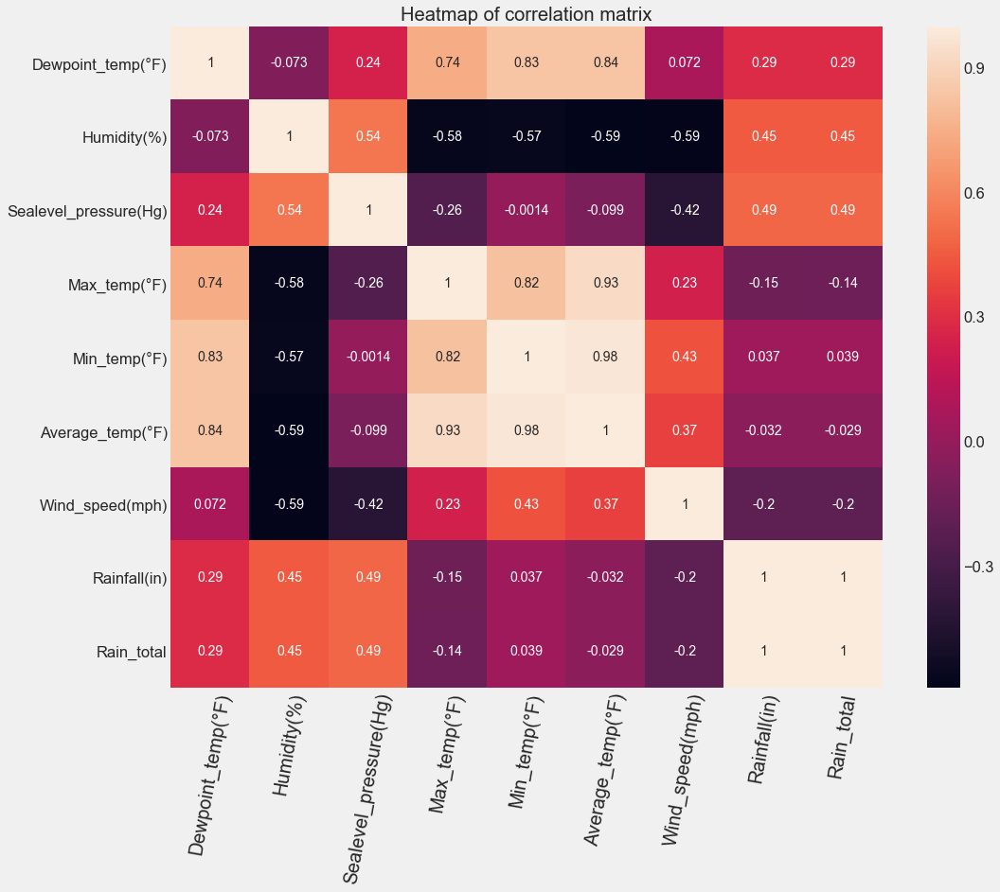

In [39]:
#Heatmap of correlation matrix of our yearly averages
correlation_matrix = city_yearly_means.corr()
fig, ax = plt.subplots(figsize=(15,12))
sns.heatmap(correlation_matrix, annot=True, ax=ax)
plt.xticks(rotation=80, fontsize=20)
plt.title('Heatmap of correlation matrix')
plt.show()

From this heatmap we can see that Dewpoint and our max, min, average daily temperatures have a positive correlation. While Humidity has a negative correlation with our temperature variables.

Rainfall has decent correlations with Humidity(0.31) and Sealevel Pressure (0.49) which makes sense because as a storm rolls in humidity usually rises as does sealevel pressures.

Below we'll us regression plots to so show these variables.

Text(0.5, 1.0, 'Regression graph between Yearly Average Dewpoint Temps and Average Temps')

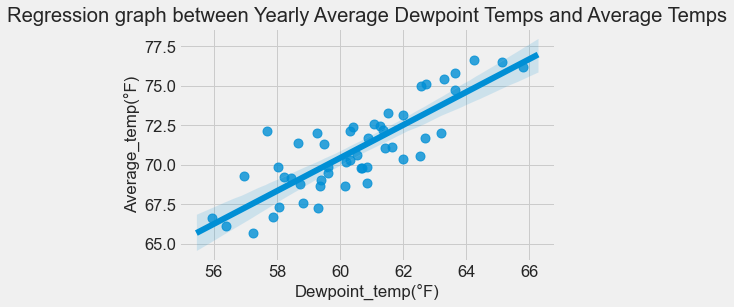

In [40]:
sns.regplot(x='Dewpoint_temp(°F)', y='Average_temp(°F)',data= city_yearly_means)
plt.title('Regression graph between Yearly Average Dewpoint Temps and Average Temps')

As our Dewpoint temperatures went up so did our Average temperatures.

Text(0.5, 1.0, 'Regression graph between Yearly Average Humidity and Average Temps')

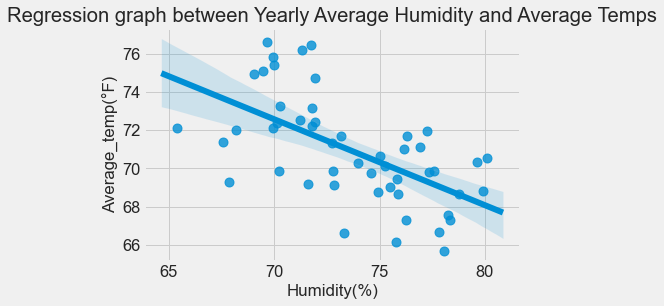

In [41]:
sns.regplot(x='Humidity(%)', y='Average_temp(°F)',data= city_yearly_means)
plt.title('Regression graph between Yearly Average Humidity and Average Temps')

As our our Humidity percentages went up our Average temperatures went down.

Text(0.5, 1.0, 'Regression graph between Yearly Average Dewpoint Temps and Average Temps')

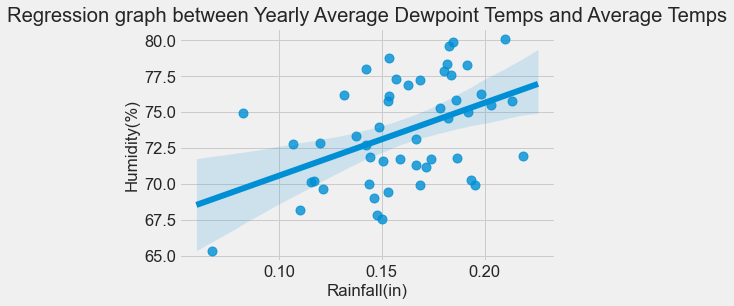

In [42]:
sns.regplot(x='Rainfall(in)', y='Humidity(%)', data=city_yearly_means)
plt.title('Regression graph between Yearly Average Dewpoint Temps and Average Temps')

As our Rainfall increased so did our Humidity percentages.

### Normality check

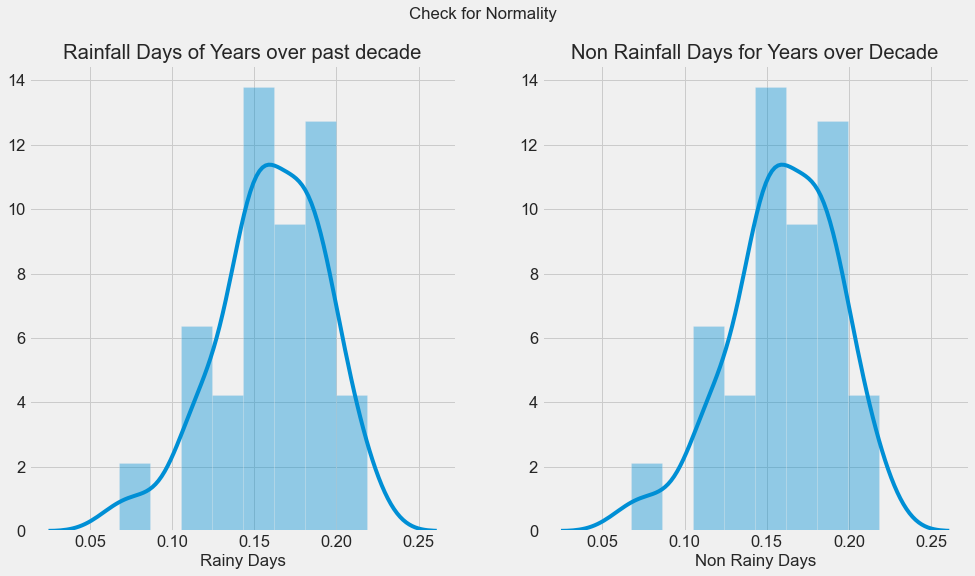

In [43]:
split = 1.2

over = city_yearly_means.loc[city_yearly_means['Humidity(%)'] >= split]
under = city_yearly_means.loc[city_yearly_means['Humidity(%)'] >= split]

#a = city_yearly_means.loc[city_yearly_means['Rain_total'] > 0]
#b = city_yearly_means.loc[city_yearly_means['Rain_total'] == 0]

plt.subplots(1,2, figsize = (15,8))

plt.subplot(121)
sns.distplot(over['Rainfall(in)'])
plt.xlabel('Rainy Days')
plt.title('Rainfall Days of Years over past decade')
plt.subplot(122)
sns.distplot(under['Rainfall(in)'])
plt.xlabel('Non Rainy Days')
plt.title('Non Rainfall Days for Years over Decade')
plt.suptitle('Check for Normality')
plt.show()

### Exploring any relationships with a target of Rainfall(in)

Being able to predict rainfall has been a common want for centuries. For our project we'll use our other variables to see if we can find a relationship between them and rainfall.

Pandas' corrwith method will return a pair-wise correlation for each numeric variable with the target and ignore non-numeric columns.

Using seaborn, we can visualize these pair-wise correlations. For ease of analysis, the code below sorts the pair-wise correlations by absolute value.

In [44]:
#create a new dataframe for Rainfall
df_time = df_time.copy()

#create a new column to show rain(1) or no rain(0) days
df_time['Rain or Not'] = np.where(df_time['Rainfall(in)'] > 0, 1, 0)

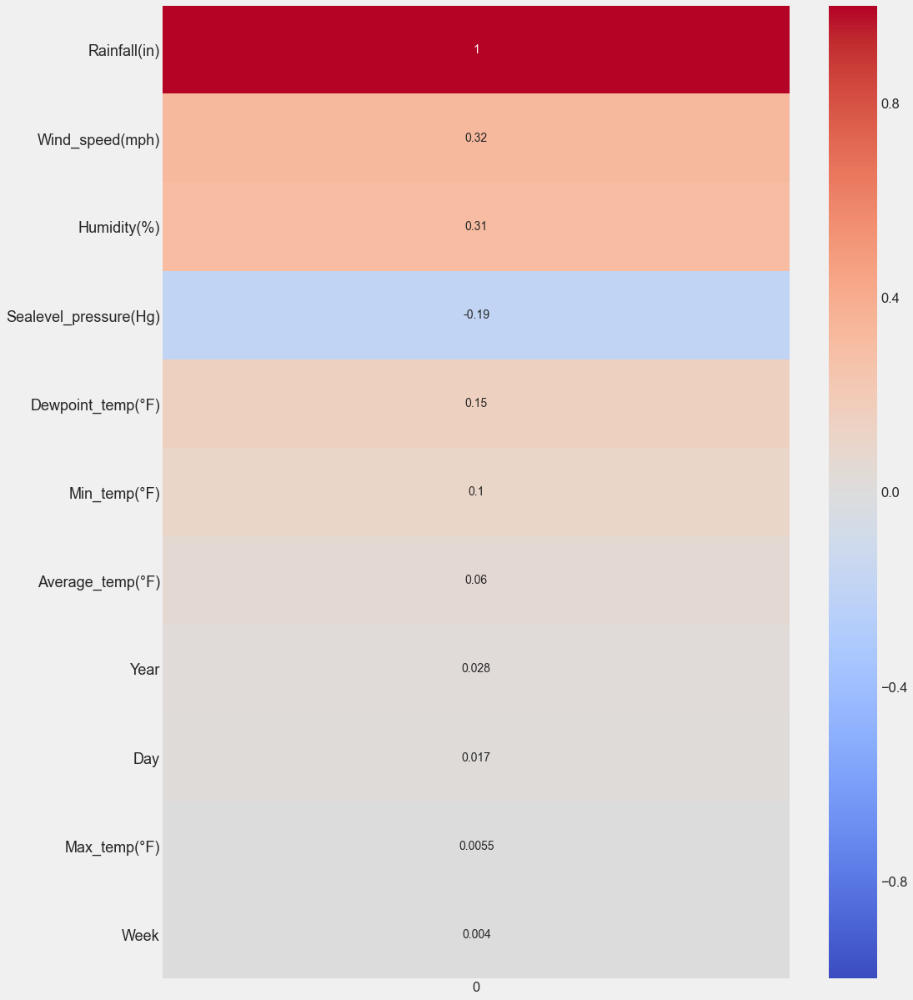

In [45]:
#create correlations chart
correlations = df_time.corrwith(df_time['Rainfall(in)']).iloc[:-1].to_frame()
correlations['abs'] = correlations[0].abs()
sorted_correlations = correlations.sort_values('abs', ascending=False)[0]

fig, ax = plt.subplots(figsize=(15,20))
plt.yticks(rotation='40', fontsize=18)
sns.heatmap(sorted_correlations.to_frame(), \
            cmap='coolwarm', annot=True, vmin=-1, vmax=1, ax=ax);

In our previous corr heatmap, we saw that features such as humidity and Sealevel pressure had a strong relationship with daily rainfall.

When running a corr heatmap of our overall dataset, we see that humidity is still positive while daily sealevel pressure now has a has a negative affect. An explanation can be that when we use our dataframe with daily averages across our variables, sealevel pressure's average has a positive correlation while when we use our overall dataset, the overall data between daily rainfall and daily sealevel pressures show negative correlations.

In [46]:
df_time['Rain or Not'].value_counts()

0    12548
1     5695
Name: Rain or Not, dtype: int64

### Finding Rainfall outliers within our dataframe

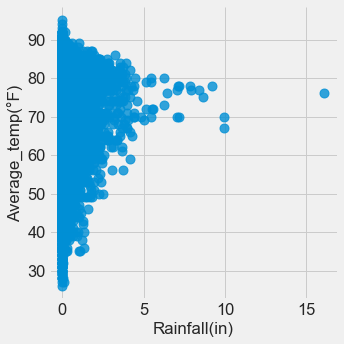

In [47]:
sns.lmplot(y='Average_temp(°F)', x='Rainfall(in)', data= df_time, fit_reg=False);

In [48]:
#Daily Precipitation outliers
df_time.loc[df_time['Rainfall(in)'] > 6]

,City,datetime,Dewpoint_temp(°F),Humidity(%),Sealevel_pressure(Hg),Max_temp(°F),Min_temp(°F),Average_temp(°F),Wind_speed(mph),Rainfall(in),Day,Week,Month_Name,Year,Rain or Not
77698,Houston,2016-04-18,65.000000,96.000000,30.02000,70.0,64.0,67.0,36.0,9.92,18,16,April,2016,1
94546,Houston,2017-08-26,75.000000,93.000000,29.82000,79.0,74.0,77.0,47.0,8.37,26,34,August,2017,1
94605,Houston,2017-08-27,74.000000,95.000000,29.75000,77.0,74.0,76.0,35.0,16.07,27,34,August,2017,1
119870,Houston,2019-09-19,74.000000,91.000000,29.88000,82.0,74.0,78.0,43.0,9.21,19,38,September,2019,1
51271,Mobile,2014-04-29,66.350515,95.206186,29.76125,78.0,62.0,70.0,40.0,9.94,29,18,April,2014,1
20784,New_Orleans,2011-09-03,75.000000,85.000000,29.55000,84.0,76.0,80.0,49.0,6.25,3,35,September,2011,1
33107,New_Orleans,2012-08-29,74.000000,93.000000,29.56000,79.0,77.0,78.0,75.0,7.86,29,35,August,2012,1
72822,New_Orleans,2015-10-25,70.000000,84.000000,29.82000,78.0,72.0,75.0,46.0,8.67,25,43,October,2015,1
125301,New_Orleans,2019-10-25,68.000000,90.000000,29.91000,79.0,66.0,73.0,25.0,6.24,25,43,October,2019,1
18161,Pascagoula,2011-05-26,70.000000,87.000000,29.89000,87.0,64.0,76.0,56.0,6.41,26,21,May,2011,1


Doing some research on the days with higher rainfalls, we see that the areas were get hit by a hurricane or tropical storm. For the time being we'll leave them in or datasets.

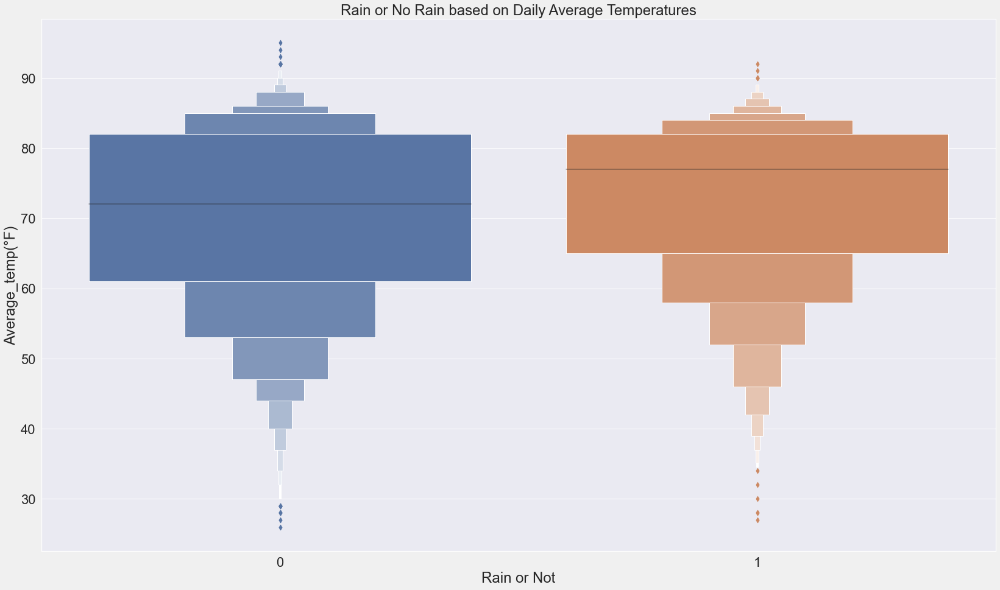

In [49]:
#boxenplot to visualize Rain or No Rain based on Daily Average Temperatures
plt.figure(figsize=(25,15)),
sns.set(font_scale=2)
sns.boxenplot(df_time['Rain or Not'], df_time['Average_temp(°F)']).set_title('Rain or No Rain based on Daily Average Temperatures');

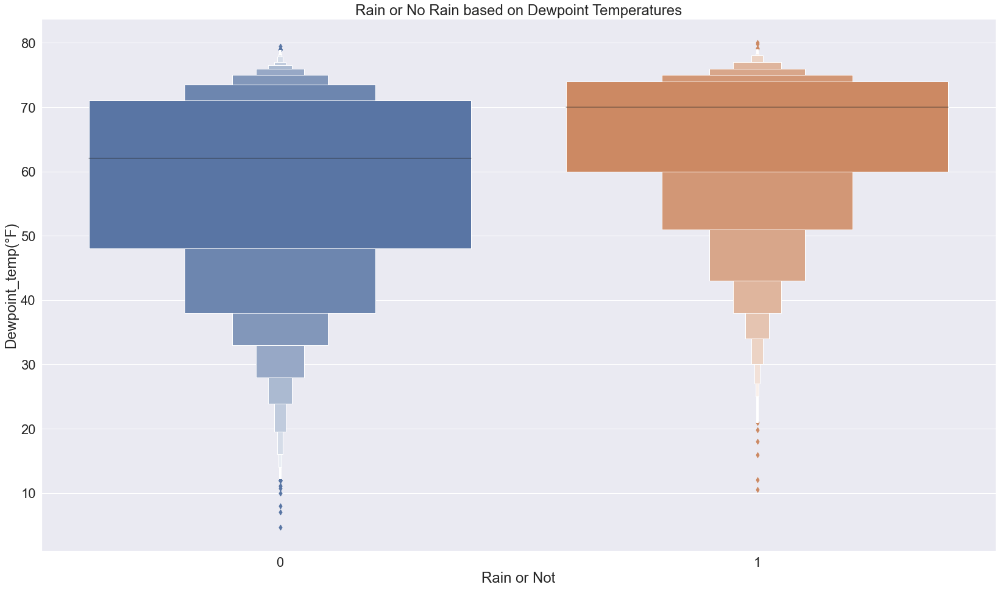

In [50]:
#boxenplot to visualize Rain or No Rain based on Daily Average Dewpoint Temperatures
plt.figure(figsize=(25,15)),
sns.set(font_scale=2)
sns.boxenplot(df_time['Rain or Not'], df['Dewpoint_temp(°F)']).set_title('Rain or No Rain based on Dewpoint Temperatures');

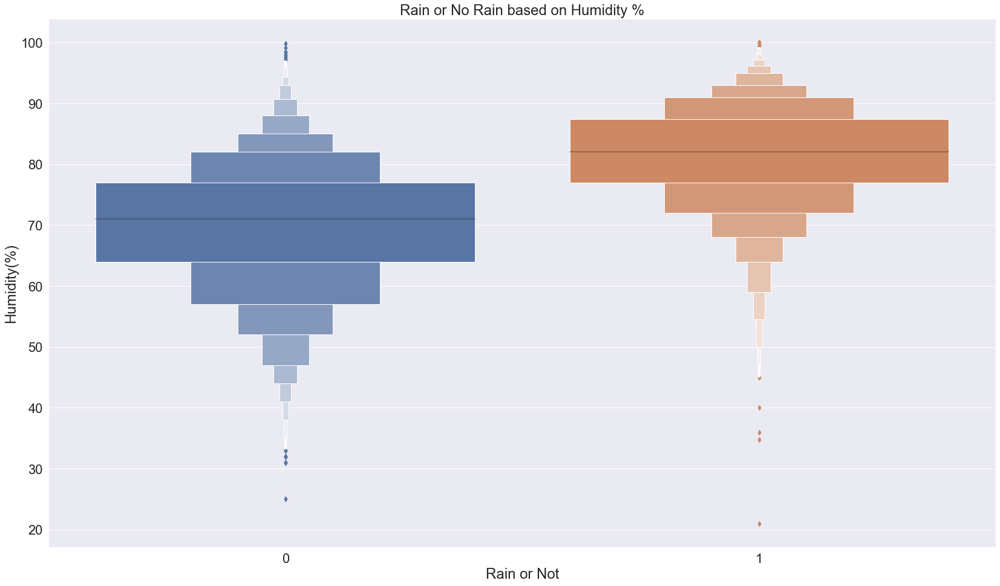

In [51]:
#boxenplot to visualize Rain or No Rain based on Daily Average of Humidity %s
plt.figure(figsize=(25,15)),
sns.set(font_scale=2)
sns.boxenplot(df_time['Rain or Not'], df_time['Humidity(%)']).set_title('Rain or No Rain based on Humidity %');

Through our boxenplots, overall it doesn't seem like average temperatures had a big affect on rainfall days. We do notice that lower temperature days tended to have non rainy days. *note that the Gulf Coast area is not know to receive snow but we considered daily rainfall to also include any snowfalls if there were any days of snow as well.

We see that there is a slight uptick in rainfall days based on days with higher dewpoint temps.

As we can see, higher humidity days tended to produce more days of rain.

In [52]:
#montly mean of total inches of rainfall in the Gulf Coast Area
df_rain_monthly = df_time['Rainfall(in)'].groupby(df_time['Month_Name']).mean()
df_rain_monthly

Month_Name
April        0.156773
August       0.285458
December     0.134072
February     0.125809
January      0.126981
July         0.222374
June         0.223883
March        0.122523
May          0.165742
November     0.081027
October      0.112059
September    0.158107
Name: Rainfall(in), dtype: float64

In [53]:
#yearly sum of total inches of Rainfall in the Gulf Coast Area
df_rain_yearly = df_time['Rainfall(in)'].groupby(df_time['Year']).sum()
df_rain_yearly

Year
2010    243.07
2011    210.39
2012    299.98
2013    293.17
2014    273.67
2015    339.19
2016    297.86
2017    347.14
2018    323.64
2019    288.89
Name: Rainfall(in), dtype: float64

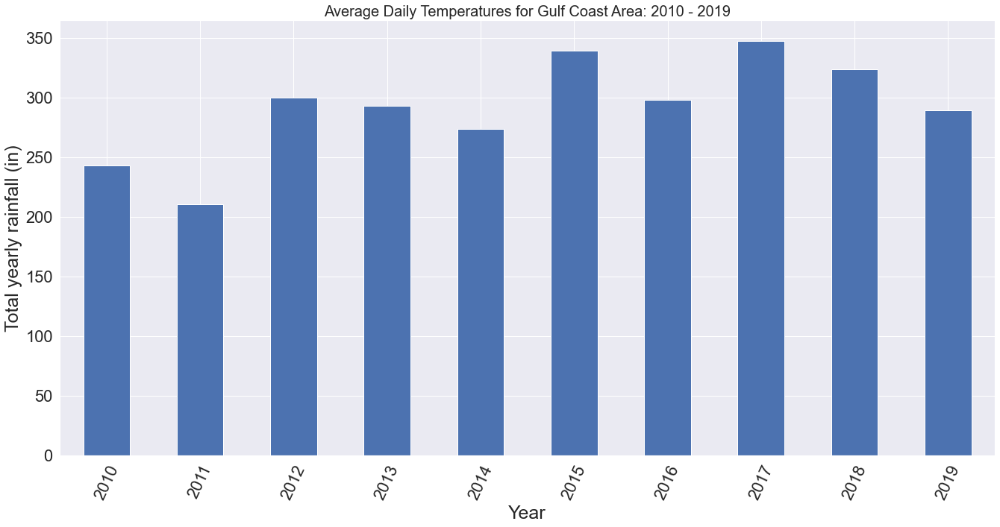

In [54]:
# Yearly rainfall pattern
df_time.groupby(
    ["Year"]
)['Rainfall(in)'].sum().plot(kind="bar", figsize=(20, 10))
plt.title('Average Daily Temperatures for Gulf Coast Area: 2010 - 2019', fontsize=20)
plt.xlabel('Year', fontsize= 25)
plt.ylabel('Total yearly rainfall (in)', fontsize= 25)
plt.xticks(rotation=65)
plt.show()

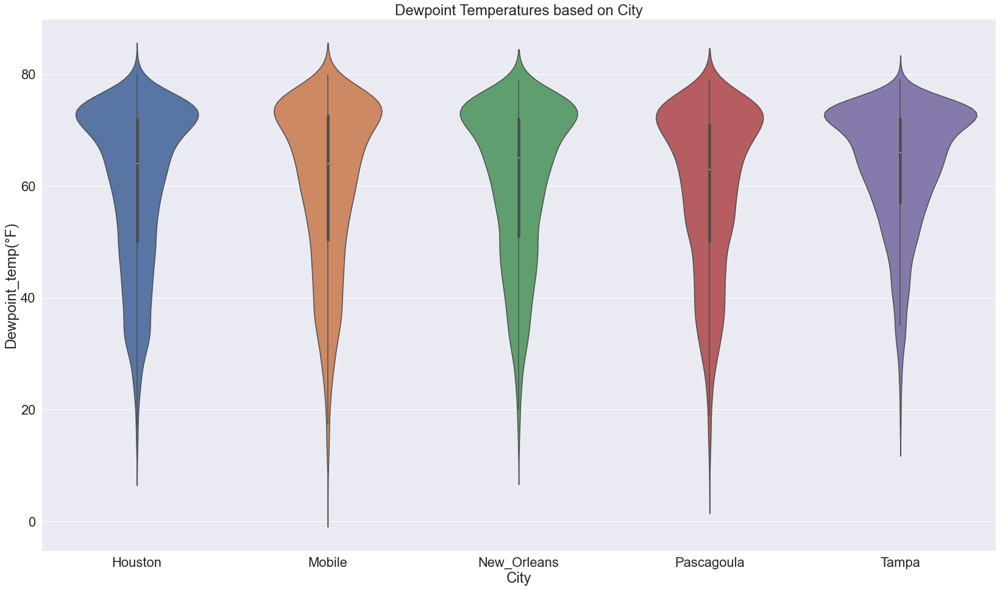

In [55]:
#violinplot to visualize Dewpoint temperatures per each city
plt.figure(figsize=(25,15)),
sns.set(font_scale=2)
sns.violinplot(df['City'], df['Dewpoint_temp(°F)']).set_title('Dewpoint Temperatures based on City');

In [56]:
fig = px.scatter(
    df_time,
    x= 'Year',
    y= 'Rainfall(in)',
    size= 'Rainfall(in)',
    color= 'Rainfall(in)',
    hover_name= 'City',
    size_max=34,
    color_continuous_scale=px.colors.sequential.PuBu
)
fig.update_layout(
    title=go.layout.Title(
        text= 'Heaviest daily rainfall for Gulf Coast Area; 2010 - 2019'
    )
)
fig['layout']['yaxis']['autorange'] = "reversed"
fig.show()

As mentioned earlier when we looked at our outliers, the big rainfalls seemed to be associated with a hurricane or tropical storm/depression hitting the area.

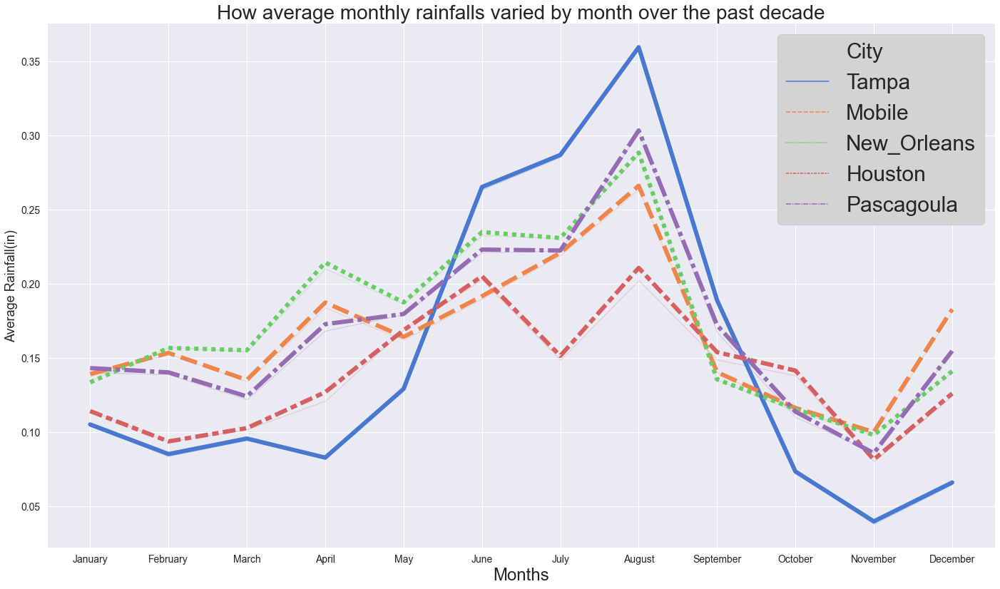

In [57]:
fig, ax = plt.subplots(figsize=(20, 12))

ax = sns.lineplot(
    x= 'Month_Name',
    y= 'Rainfall(in)',
    linewidth=6,
    data=df_time,
    hue= 'City',
    hue_order=['Tampa', 'Mobile', 'New_Orleans', 'Houston', 'Pascagoula'],
    style= 'City',
    style_order=['Tampa', 'Mobile', 'New_Orleans', 'Houston', 'Pascagoula'],
    legend="full",
    ci=False,
    sort=False,
    palette=sns.color_palette('muted', 5),
)

plt.title('How average monthly rainfalls varied by month over the past decade', fontsize= 28)

plt.xlabel('Months')
plt.ylabel("Average Rainfall(in)", fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

sns.despine()

plt.legend(fontsize=30, loc="best", facecolor='lightgray', framealpha=1)
plt.tight_layout()
plt.show()

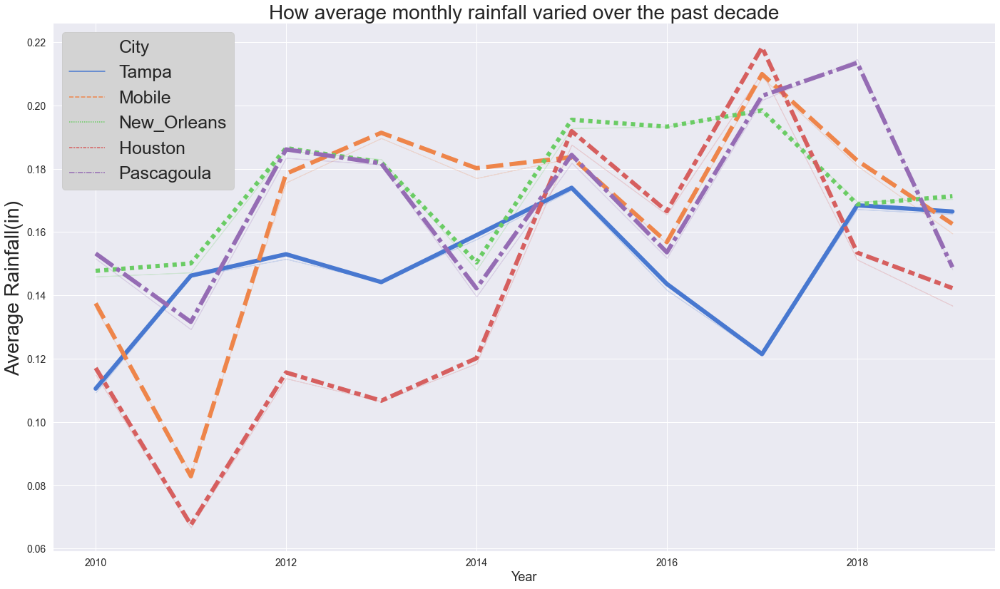

In [58]:
fig, ax = plt.subplots(figsize=(20, 12))

ax = sns.lineplot(
    x= 'Year',
    y= 'Rainfall(in)',
    linewidth=6,
    data=df_time,
    hue= 'City',
    hue_order=['Tampa', 'Mobile', 'New_Orleans', 'Houston', 'Pascagoula'],
    style= 'City',
    style_order=['Tampa', 'Mobile', 'New_Orleans', 'Houston', 'Pascagoula'],
    legend="full",
    ci=False,
    sort=False,
    palette=sns.color_palette('muted', 5),
)

plt.title('How average monthly rainfall varied over the past decade', fontsize= 28)

plt.xlabel('Year', fontsize= 18)
plt.ylabel("Average Rainfall(in)", fontsize= 28)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

sns.despine()

plt.legend(fontsize= 25, loc= 'best', facecolor= 'lightgray', framealpha=1)
plt.tight_layout()
plt.show()

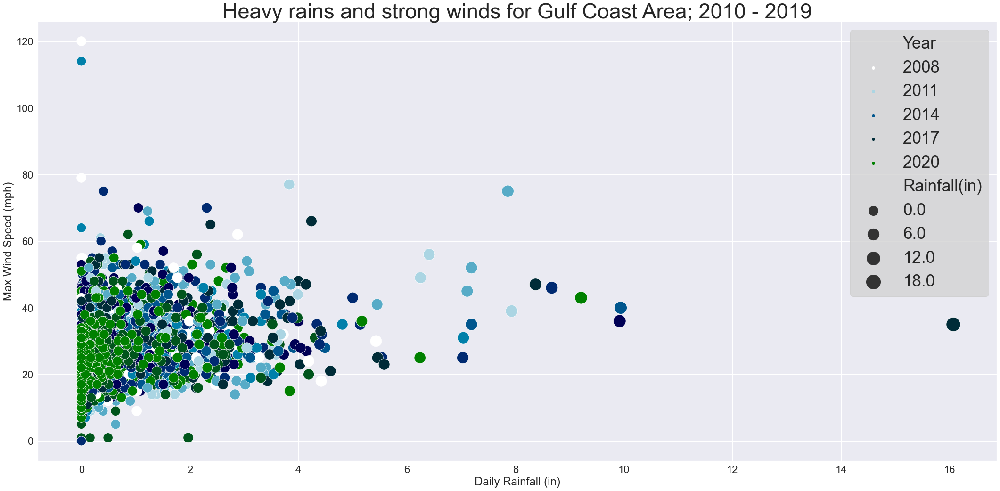

In [59]:
#We naturally associate strong winds with heavy rain as well. Let's see how the two conditions vary over the years: The bigger triangles indicate a higher amount of rain, and those with a darker shade are more recent whereas triangles with a lighter shade reflect earlier records.

plt.figure(figsize=(30, 15))
sns.set(font_scale=2)
sns.scatterplot(
    x='Rainfall(in)',
    y= 'Wind_speed(mph)',
    data= df_time,
    marker="o",
    sizes=(400, 900),
    size= 'Rainfall(in)',
    hue= 'Year',
    palette= 'ocean_r',
)
plt.title('Heavy rains and strong winds for Gulf Coast Area; 2010 - 2019', fontsize= 45)
plt.ylabel('Max Wind Speed (mph)')
plt.xlabel('Daily Rainfall (in)')
plt.legend(prop={'size': 35}, facecolor=('lightgray'))
plt.tight_layout()
plt.show()

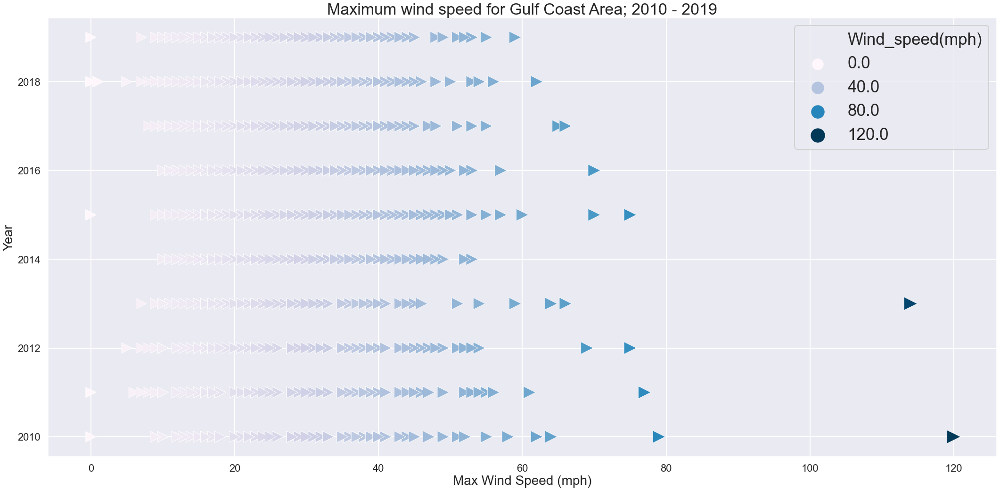

In [60]:
plt.figure(figsize=(30, 15))
#sns.set(font_scale=3)
sns.set_context('poster')
sns.scatterplot(
    x= 'Wind_speed(mph)',
    y= 'Year',
    data= df_time,
    marker= '>',
    sizes=(505, 800),
    size= 'Wind_speed(mph)',
    hue= 'Wind_speed(mph)',
    palette= 'PuBu'
    )

plt.title('Maximum wind speed for Gulf Coast Area; 2010 - 2019', fontsize= 34)
plt.ylabel('Year', fontsize=28)
plt.xlabel('Max Wind Speed (mph)', fontsize= 28)
plt.legend(prop={'size': 35})
plt.tight_layout()
plt.show()

                count      mean       std  min  25%  50%   75%    max
Rainfall(in)  18243.0  0.159897  0.523273  0.0  0.0  0.0  0.03  16.07


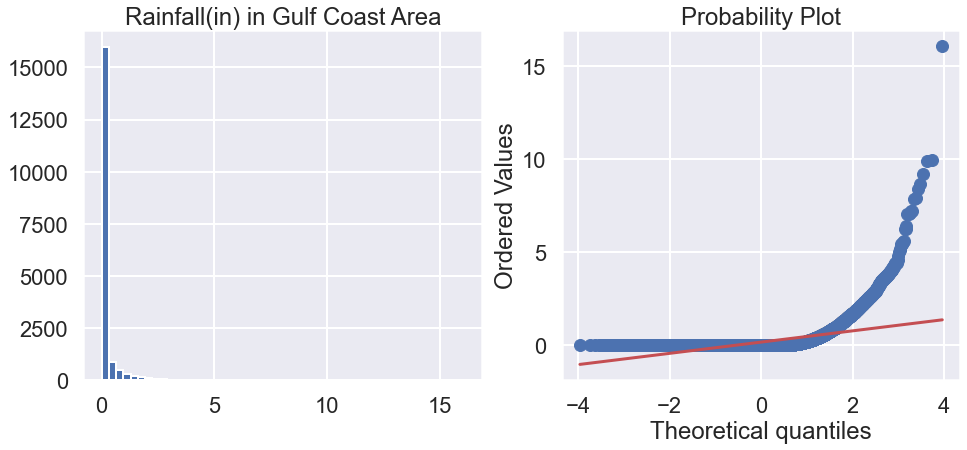

In [62]:
#create dataframe consisting of Rainfall and datetime - dfr
dfr= df_time.loc[:,['datetime','Rainfall(in)']]
dfr.set_index('datetime',inplace=True)

print(dfr.describe().T)

plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
df['Rainfall(in)'].hist(bins=50)
plt.title('Rainfall(in) in Gulf Coast Area')
plt.subplot(1,2,2)
stats.probplot(df['Rainfall(in)'], plot=plt)
plt.show();

Our normal probability plot shows that our data isn't normally distributed.

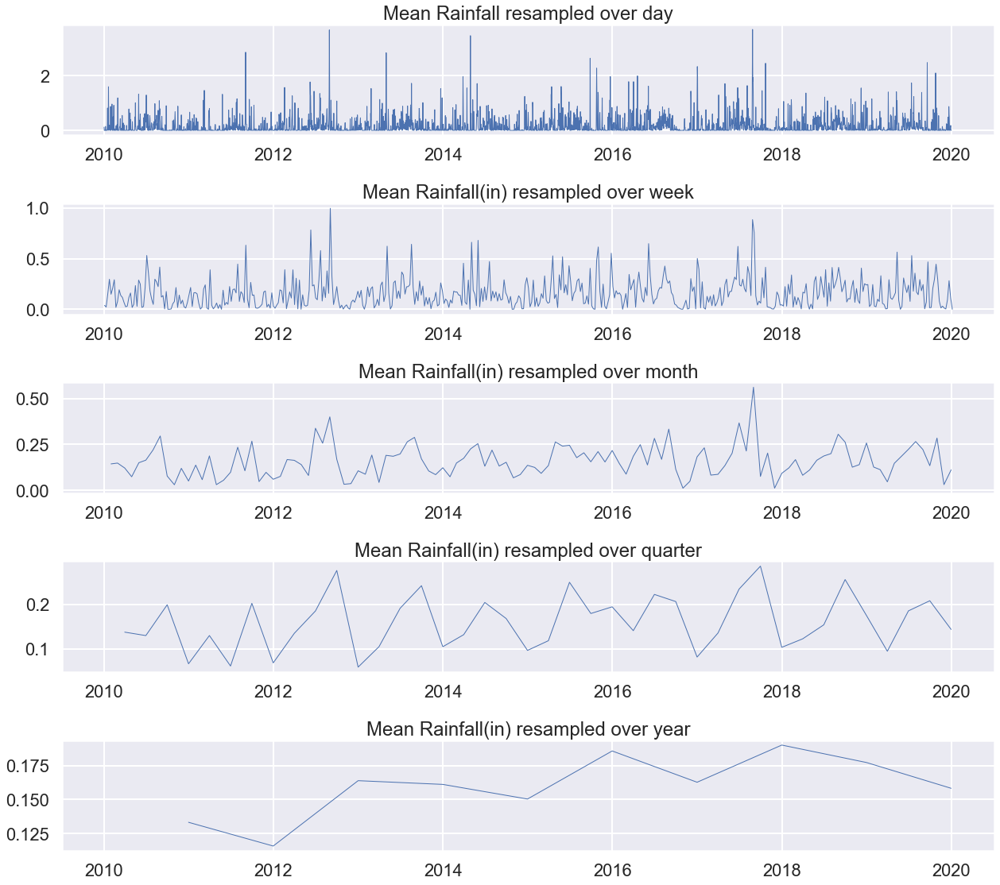

In [64]:
fig = plt.figure(figsize=(18,16))
fig.subplots_adjust(hspace=.4)
ax1 = fig.add_subplot(5,1,1)
ax1.plot(dfr['Rainfall(in)'].resample('D').mean(),linewidth=1)
ax1.set_title('Mean Rainfall resampled over day')
ax1.tick_params(axis='both', which='major')

ax2 = fig.add_subplot(5,1,2, sharex=ax1)
ax2.plot(dfr['Rainfall(in)'].resample('W').mean(),linewidth=1)
ax2.set_title('Mean Rainfall(in) resampled over week')
ax2.tick_params(axis='both', which='major')

ax3 = fig.add_subplot(5,1,3, sharex=ax1)
ax3.plot(dfr['Rainfall(in)'].resample('M').mean(),linewidth=1)
ax3.set_title('Mean Rainfall(in) resampled over month')
ax3.tick_params(axis='both', which='major')

ax4  = fig.add_subplot(5,1,4, sharex=ax1)
ax4.plot(dfr['Rainfall(in)'].resample('Q').mean(),linewidth=1)
ax4.set_title('Mean Rainfall(in) resampled over quarter')
ax4.tick_params(axis='both', which='major')

ax5  = fig.add_subplot(5,1,5, sharex=ax1)
ax5.plot(dfr['Rainfall(in)'].resample('A').mean(),linewidth=1)
ax5.set_title('Mean Rainfall(in) resampled over year')
ax5.tick_params(axis='both', which='major')
plt.tight_layout()
plt.show();

Overall our time series graphs don't show much of an upward or downward trend for most of the graphs. Our annual graph does show a bit of a upward trend.

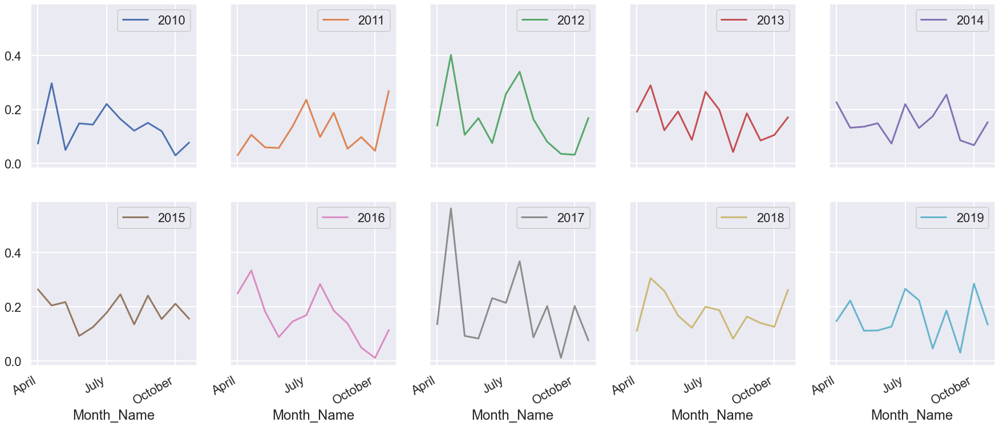

In [63]:
pd.pivot_table(df_time.loc[df_time['Year'] >= 2010], values = 'Rainfall(in)', 
               columns = "Year", index = "Month_Name").plot(subplots= True, figsize=(27, 20), layout=(3, 5), sharey=True);

A deeper look at our yearly Rainfall breakdown shows some upticks and downticks but overall 2017 between April and May seemed to have the biggest change amongst the years.

### Exploring any relationships with a target of Temperatures

Our data also provides us an insight for finding any temperature related patterns. We'll use our Max, Min and Average temp variables.

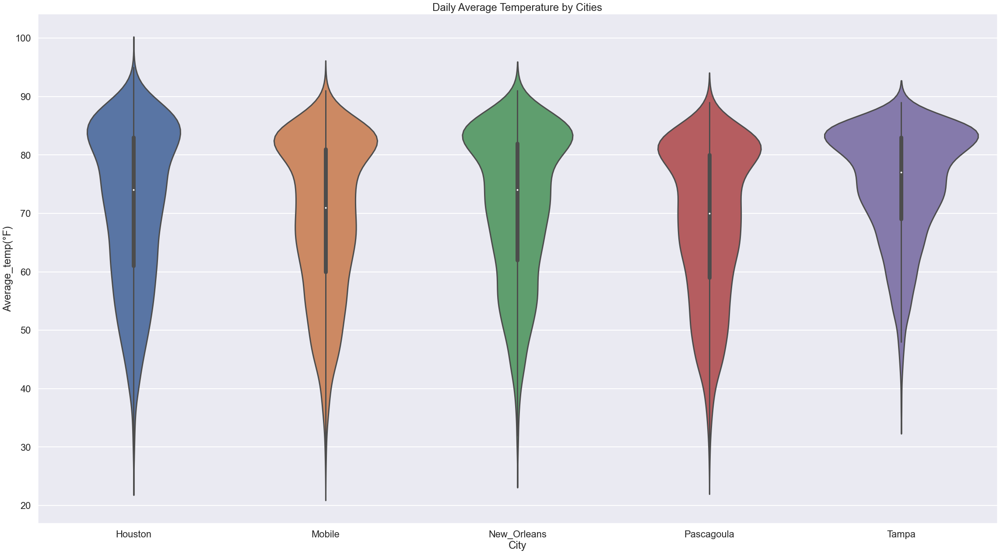

In [65]:
#violinplot to visualize Average Temps per each city
plt.figure(figsize=(35,20)) # adjust the fig size to see everything
sns.violinplot(df['City'], df['Average_temp(°F)']).set_title('Daily Average Temperature by Cities');

Houston has more averaged higher temperatures and it looks to have more combined upper to mid 80 degree temperatures while also have the fewest lower temperatures amongst our cities.

We'll take a look at our general Max, Min and Average temperatures.

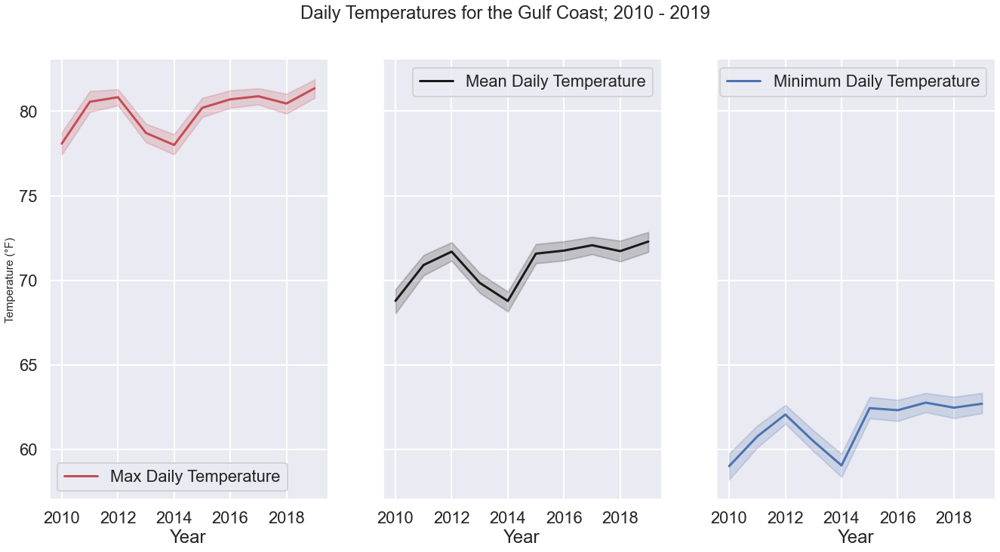

In [66]:
fig, axs = plt.subplots(1, 3, figsize=(20, 10), sharey=True)
sns.lineplot(
    x='Year',
    y='Max_temp(°F)',
    linewidth=3,
    data= df_time,
    label='Max Daily Temperature',
    color='r',
    ax=axs[0],
)
sns.lineplot(
    x= 'Year',
    y= 'Average_temp(°F)',
    linewidth=3,
    data= df_time,
    label= 'Mean Daily Temperature',
    color= 'k',
    ax=axs[1],
)
sns.lineplot(
    x= 'Year',
    y= 'Min_temp(°F)',
    linewidth=3,
    data= df_time,
    label= 'Minimum Daily Temperature',
    color= 'b',
    ax=axs[2],
)
fig.suptitle('Daily Temperatures for the Gulf Coast; 2010 - 2019', fontsize=24)
axs[0].set_ylabel('Temperature (°F)', fontsize=15)
sns.despine()
plt.show()

We can see that temperatures are rising each year. Max Daily Temps averaged under 80 degrees in 2010 but by 2019 they averaged above 80 degrees. Low Daily Temps averaged below 60 degrees in 2010 and averaged around 63 degrees by 2019.

We can look at boxplots of our temperature variables over the months to get more of a visual perspective.

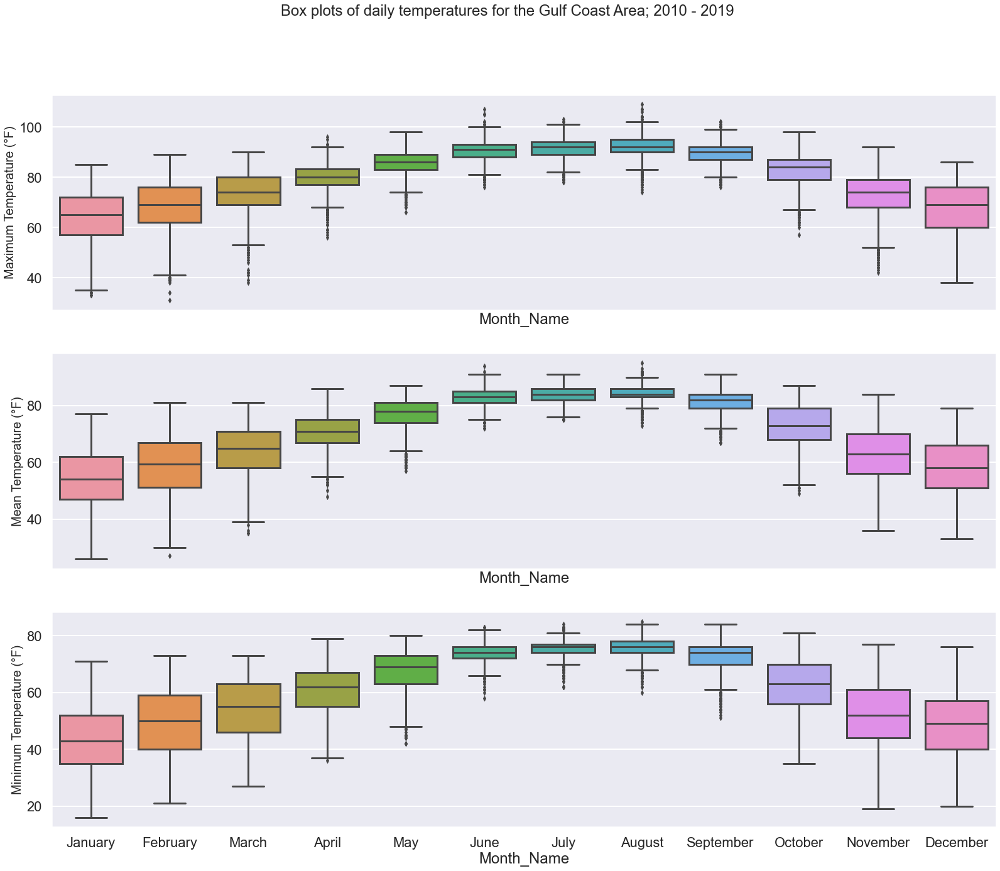

In [67]:
fig, axs = plt.subplots(3, 1, figsize=(24, 20), sharex=True)
sns.boxplot(y='Max_temp(°F)', x="Month_Name", data= df_time, ax=axs[0])
sns.boxplot(y='Average_temp(°F)', x="Month_Name", data= df_time, ax=axs[1])
sns.boxplot(y='Min_temp(°F)', x="Month_Name", data= df_time, ax=axs[2])
fig.suptitle(
    'Box plots of daily temperatures for the Gulf Coast Area; 2010 - 2019', fontsize=24
)
axs[0].set_ylabel('Maximum Temperature (°F)', fontsize= 20)
axs[1].set_ylabel('Mean Temperature (°F)', fontsize= 20)
axs[2].set_ylabel('Minimum Temperature (°F)', fontsize= 20)
plt.show()

Our temperature boxplots show a few upper and lower outliers especially in the months of June and July for minimum temperatures. Max temperatures had a larger range of upper and lower outliers throughout the months.

Their respective main quartiles fall in normal seasonal ranges that we expected.

In [68]:
df_temp_max_monthly = df_time['Max_temp(°F)'].groupby(df_time['Month_Name']).mean()
print('Max_temp(°F): \n', df_temp_max_monthly.sort_values(ascending=False))

Max_temp(°F): 
 Month_Name
August       92.240645
July         91.758710
June         90.691795
September    89.722000
May          85.941935
October      82.842479
April        79.803333
March        73.603871
November     73.004667
February     68.138298
December     67.574593
January      63.689032
Name: Max_temp(°F), dtype: float64


In [69]:
df_temp_min_monthly = df_time['Min_temp(°F)'].groupby(df_time['Month_Name']).mean()
print('Min_temp(°F): \n', df_temp_min_monthly.sort_values(ascending=False))

Min_temp(°F): 
 Month_Name
August       75.769677
July         75.565806
June         74.004670
September    72.431333
May          67.381935
October      62.406714
April        60.716667
March        53.945161
November     52.026667
February     49.354610
December     48.881433
January      43.637419
Name: Min_temp(°F), dtype: float64


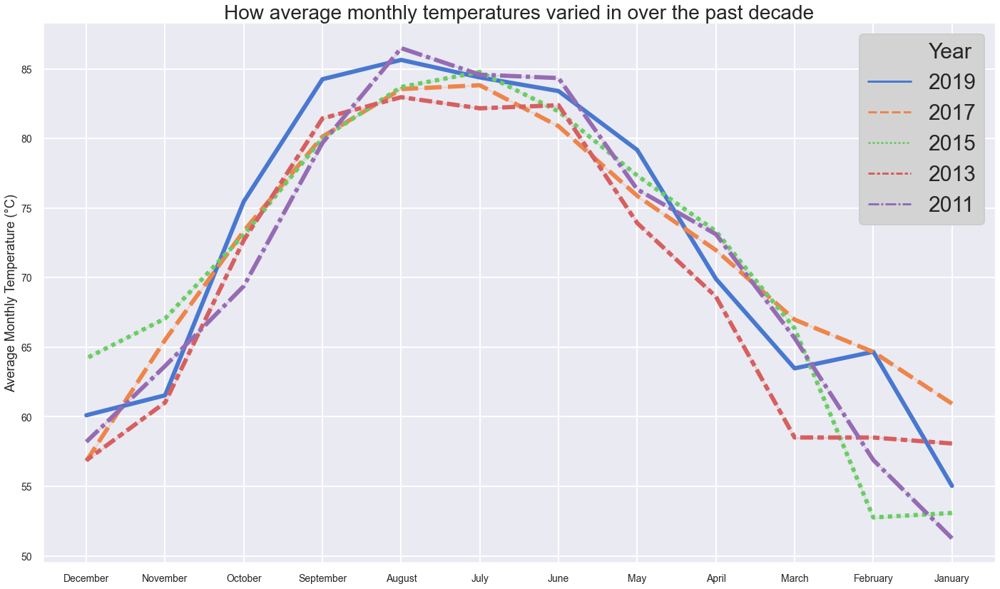

In [70]:
fig, ax = plt.subplots(figsize=(20, 12))

ax = sns.lineplot(
    x="Month_Name",
    y="Average_temp(°F)",
    linewidth=6,
    data=df_time,
    hue="Year",
    hue_order=[2019, 2017, 2015, 2013, 2011],
    style="Year",
    style_order=[2019, 2017, 2015, 2013, 2011],
    legend="full",
    ci=False,
    sort=False,
    palette=sns.color_palette('muted', 5),
)

plt.title('How average monthly temperatures varied in over the past decade', fontsize= 28)

ax.invert_xaxis()

plt.xlabel("")
plt.ylabel("Average Monthly Temperature (°C)", fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

sns.despine()

plt.legend(fontsize=30, loc="best", facecolor='lightgray', framealpha=1)
plt.tight_layout()
plt.show()

The bold blue line shows how average monthly temperatures in 2019 have generally surpassed those at similar points for most of the decade. An exceptions occurred during June through August of 2013.

Other striking trends include:

The huge jump in average temperature for January, from 26.5°C in 1989 to 27.97 in 2019, a rise of 1.47°C.

In the years 1989, 1999 and 2009, the average monthly temperatures started to dip after the familiar June-July spikes. But in 2019, the monthly temperatures bucked the mid-year trend and instead rose to sharp new highs for the July-September period. The average monthly temperatures for August and September 2019 - respectively 29.12°C and 29.03°C - were the highest ever in Singapore for those months.

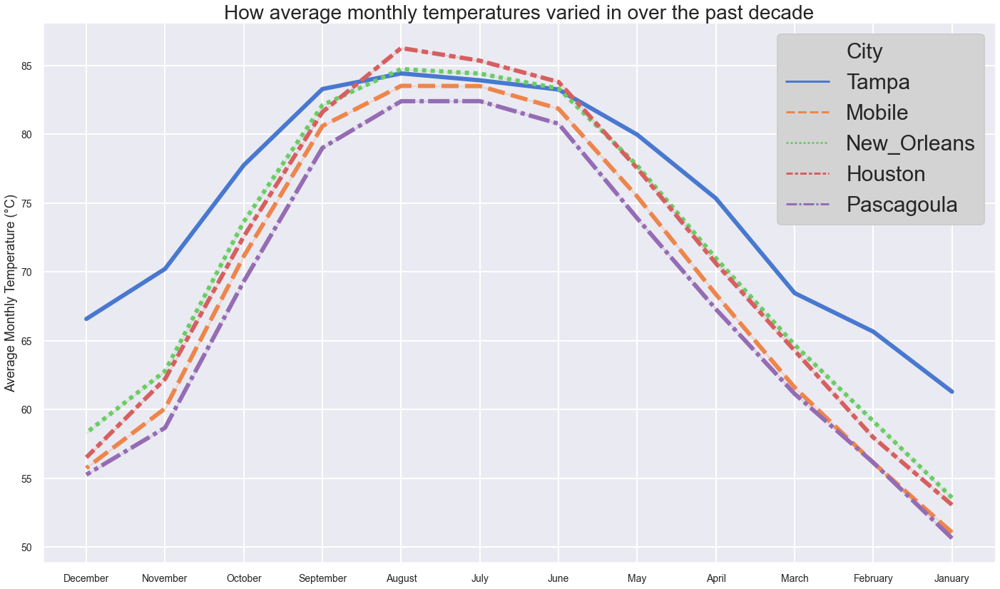

In [71]:
fig, ax = plt.subplots(figsize=(20, 12))

ax = sns.lineplot(
    x="Month_Name",
    y="Average_temp(°F)",
    linewidth=6,
    data=df_time,
    hue="City",
    hue_order=['Tampa', 'Mobile', 'New_Orleans', 'Houston', 'Pascagoula'],
    style="City",
    style_order=['Tampa', 'Mobile', 'New_Orleans', 'Houston', 'Pascagoula'],
    legend="full",
    ci=False,
    sort=False,
    palette=sns.color_palette('muted', 5),
)

plt.title('How average monthly temperatures varied in over the past decade', fontsize= 28)

ax.invert_xaxis()

plt.xlabel("")
plt.ylabel("Average Monthly Temperature (°C)", fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

sns.despine()

plt.legend(fontsize=30, loc="best", facecolor='lightgray', framealpha=1)
plt.tight_layout()
plt.show()

We can see that Tampa has the closest average temperature range amongst our cities. Averaging between mid 60s and lower to mid 80s throughout the year.

Houston have average temperatures between mid 50s to upper 80s depending on the time of the year.

In [72]:
df_temp_max_yearly = df_time['Max_temp(°F)'].groupby(df_time['Year']).mean()
print('Max_temp(°F): \n', df_temp_max_yearly)

Max_temp(°F): 
 Year
2010    78.081644
2011    80.559648
2012    80.828415
2013    78.713029
2014    78.003297
2015    80.202192
2016    80.704372
2017    80.885479
2018    80.456438
2019    81.356164
Name: Max_temp(°F), dtype: float64


In [73]:
df_temp_min_yearly = df_time['Min_temp(°F)'].groupby(df_time['Year']).mean()
print('Min_temp(°F): \n', df_temp_min_yearly)

Min_temp(°F): 
 Year
2010    59.010959
2011    60.762507
2012    62.061749
2013    60.483233
2014    59.051099
2015    62.439452
2016    62.317486
2017    62.763288
2018    62.467397
2019    62.698630
Name: Min_temp(°F), dtype: float64


As we can see, there has been an uptick in average max temperatures in the Gulf Coast Area. Gaining almost 3 degrees hotter over the past decade.

Just like with average yearly max temps slowly rising, the average yearly minimum temperatures have gone up over 3 degrees over the past decade.

At least in the Gulf Coast area there is a warming trend occurring.

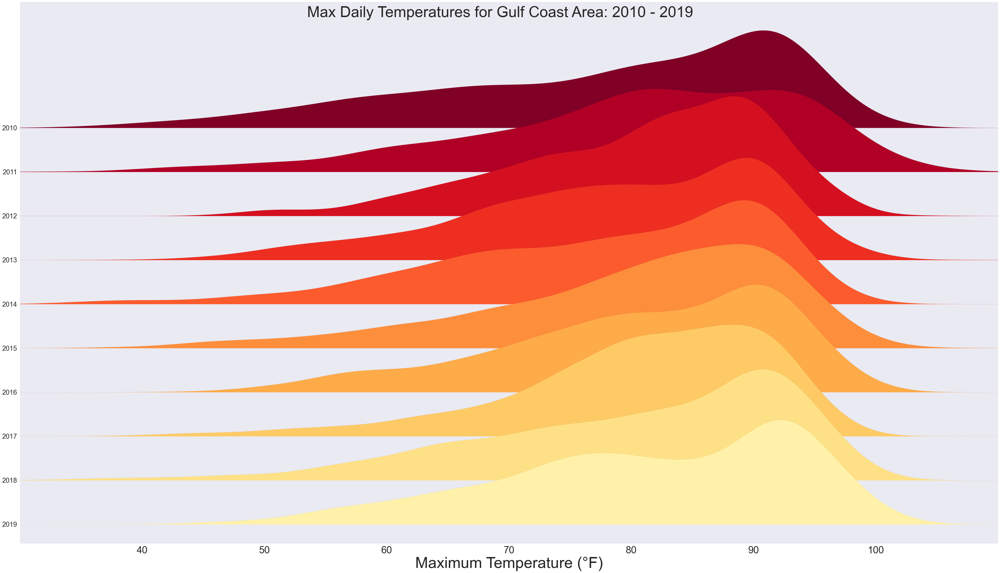

In [74]:
sns.set(font_scale= 2)
fig, axes = joypy.joyplot(df_time, by="Year", column="Max_temp(°F)", figsize=(50,28),
             linewidth=0.05,overlap=3,colormap=cm.YlOrRd_r, x_range=[30,110])
fig.suptitle('Max Daily Temperatures for Gulf Coast Area: 2010 - 2019', fontsize= 54)
plt.xlabel('Maximum Temperature (°F)', fontsize= 55)
plt.ylabel('Year')
plt.xticks(fontsize= 35)
plt.yticks(fontsize= 25)
plt.show()

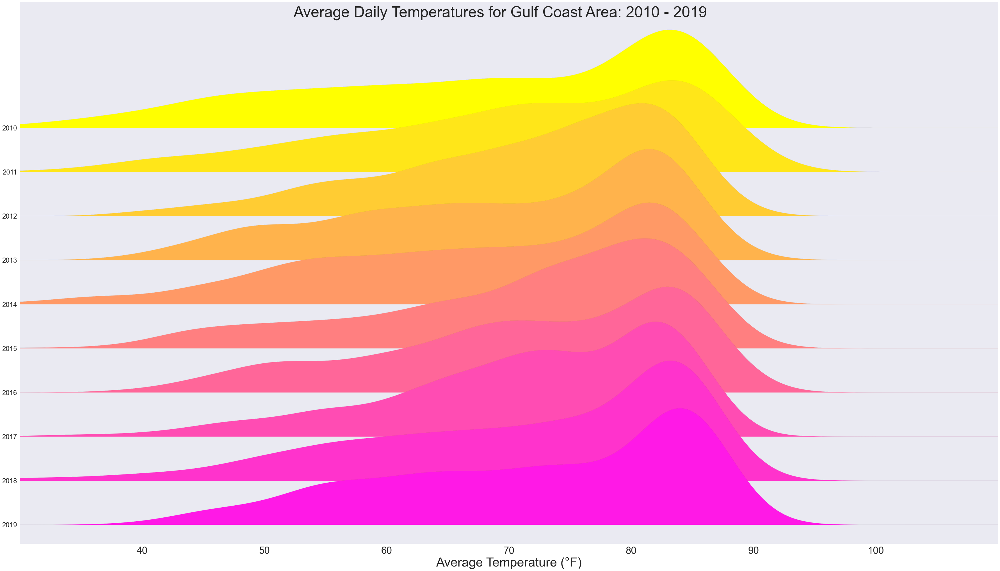

In [75]:
sns.set(font_scale= 2)
fig, axes = joypy.joyplot(df_time, by= 'Year', column= 'Average_temp(°F)', figsize=(50,28),
             linewidth=0.05,overlap=3,colormap=cm.spring_r, x_range=[30,110])
fig.suptitle('Average Daily Temperatures for Gulf Coast Area: 2010 - 2019', fontsize= 54)
plt.xlabel('Average Temperature (°F)', fontsize= 45)
plt.xticks(fontsize= 35)
plt.yticks(fontsize= 25)
plt.ylabel('Year', fontsize= 45)
plt.show()

## Inferential Statistics

***Null Hypothesis:*** Can we predict rain patterns for years to come based on past data from the Gulf Coast Area.

***Alternate Hypothesis:*** We will not be able to predict future rain patterns based off of past weather data for the Gulf Coast Area.

In [76]:
m_rainfall = np.mean(df_time['Rainfall(in)'])
print('Mean: ',m_rainfall)
s_rainfall = np.std(df_time['Rainfall(in)'])
print('Std: ',m_rainfall)

Mean:  0.15989694677410646
Std:  0.15989694677410646


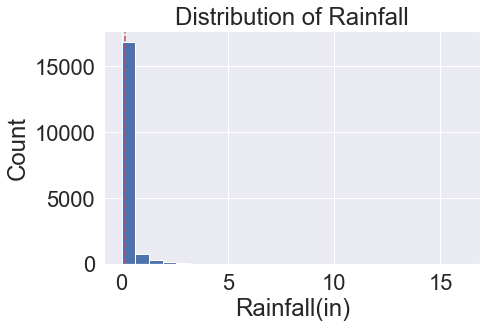

In [77]:
plt.hist(df_time['Rainfall(in)'], bins=25, color='b')
plt.xlabel('Rainfall(in)')
plt.ylabel('Count')
plt.title('Distribution of Rainfall')
plt.axvline(m_rainfall, color='r', linestyle='--')

In [78]:
#Calculate t-value
thres = 12000
tam = len(df_time['Rainfall(in)']) - 1
prob_tam = t.cdf(thres, tam, loc=m_rainfall, scale=s_rainfall)
print('Probabilty value: ', prob_tam)

Probabilty value:  1.0


In [79]:
cv_tam = t.ppf(0.975, tam)
print('Critical value: ', cv_tam)

Critical value:  1.9600940374927598


In [80]:
alpha = (1- 0.975)
con_tam = t.interval(alpha, tam, loc=m_rainfall, scale=s_rainfall)
print('Confidence intervals: ', con_tam)

Confidence intervals:  (0.1434988650639039, 0.17629502848430892)


In [81]:
df_rain = df_time['Rainfall(in)'].loc[df_time['Rain or Not'] >= 1]
df_no_rain = df_time['Rainfall(in)'].loc[df_time['Rain or Not'] == 0]

n1 = len(df_rain)
n0 = len(df_no_rain)
mean1 = np.mean(df_rain)
mean0 = np.mean(df_no_rain)
std1 = np.std(df_rain)
std0= np.std(df_no_rain)

print('Numer of Rainy Days: ', n1)
print('Number of non Rainy Days: ', n0)
print('Mean of Rainy Days: ', mean1)
print('Standard Deviation of Rainy Days: ', std1)

Numer of Rainy Days:  5695
Number of non Rainy Days:  12548
Mean of Rainy Days:  0.5122036874451316
Standard Deviation of Rainy Days:  0.834636440830481


In [82]:
num = ((n1-1)*std1**2) + ((n0-1)*std0**2)
denom = (n1 + n0 -2)
sp = np.sqrt((num)/(denom))
print('Pooled std: ', sp)

Pooled std:  0.4663175409481184


In [83]:
t_test = (mean1 - mean0)/(sp * np.sqrt(((1/n1) + (1/n0))))
print('T-Test: ', t_test)

T-Test:  68.74592164509636


In [84]:
from scipy.stats import ttest_ind
ttest_ind(df_rain, df_no_rain, equal_var = True)

Ttest_indResult(statistic=68.73988574169559, pvalue=0.0)

In [85]:
ttest_ind(df_rain, df_no_rain, equal_var = False)

Ttest_indResult(statistic=46.3077936849106, pvalue=0.0)

We can observe that 

## Bootstrapping
We'll create a bootstrap sampling to estimate a 95% confidence interval lower limit.

Null Hypothesis: Can we predict rain patterns for years to come based on past data from the Gulf Coast Area.

Alternate Hypothesis: We will not be able to predict future rain patterns based off of past weather data for the Gulf Coast Area.

In [86]:
np.random.seed(47)
N_rep = 10000

bs_rainfall = df_time['Rainfall(in)']
sample = np.random.choice(bs_rainfall, size= N_rep)

In [87]:
bootstrap_replicate = np.mean(sample)
print(bootstrap_replicate)

0.168014


In [88]:
def bootstrap_replicate(data, func):
    bootstrap_sample = np.random.choice(data, len(data))
    return bootstrap_sample, func(bootstrap_sample)

bootstrap_replicate(bs_rainfall, np.mean)

(array([0.5, 0. , 0. , ..., 0. , 0. , 0. ]), 0.16083045551718467)

In [89]:
def bootstrap_replicate(data, func, size=1):
    bootstrap_sample = np.random.choice(data, len(data))
    return func(bootstrap_sample)

bootstrap_replicates= []

for i in range(N_rep):
    bs_rep = bootstrap_replicate(bs_rainfall, np.mean)
    bootstrap_replicates.append(bs_rep)

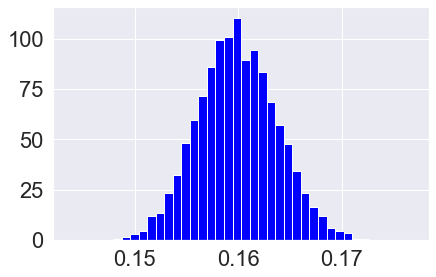

In [90]:
plot = plt.hist(bootstrap_replicates, bins=40, color='blue', density=True)
plt.show()

In [91]:
confidence_int = np.percentile(bootstrap_replicates, [2.5, 97.5])
print(confidence_int)

[0.15252966 0.16766235]


In [92]:
#Divide dataset into two groups (rainfall amount/no rainfall)
rainfall = df['Rainfall(in)'].loc[df_time['Rain or Not'] >= 1]
no_rainfall = df['Rainfall(in)'].loc[df_time['Rain or Not'] == 0]

In [93]:
# Calculate standard deviation for opioid and non opioid prescriptions
std_sum = np.std(rainfall)
std_non = np.std(no_rainfall)

print('Standard Deviation of Rainy Days: ', std_sum)
print('Standard Deviation of Non Rainy Days: ', std_non)

Standard Deviation of Rainy Days:  0.834636440830481
Standard Deviation of Non Rainy Days:  0.0


In [94]:
def bs_samp_std(data1, data2):
    bs_sample1 = np.random.choice(data1, len(data1))
    bs_sample2 = np.random.choice(data2, len(data2))
    std_diff = np.std(bs_sample1) - np.std(bs_sample2)
    return std_diff

In [95]:
samples_std = [bs_samp_std(rainfall, no_rainfall) for i in range(N_rep)]

print('Difference of STD for opioid and non opioid prescriptions: ', std1 - std0)
print ('Difference of STD for bootstrap samples: ', np.mean(samples_std))
print('The 95% confidence interval for the difference between the standard deviations\
 of opioid and non opioid prescriptions is: ',np.percentile(samples_std,[2.5,97.5]))

Difference of STD for opioid and non opioid prescriptions:  0.834636440830481
Difference of STD for bootstrap samples:  0.8332447469738007
The 95% confidence interval for the difference between the standard deviations of opioid and non opioid prescriptions is:  [0.76690786 0.90884574]


Text(0, 0.5, 'Frequency')

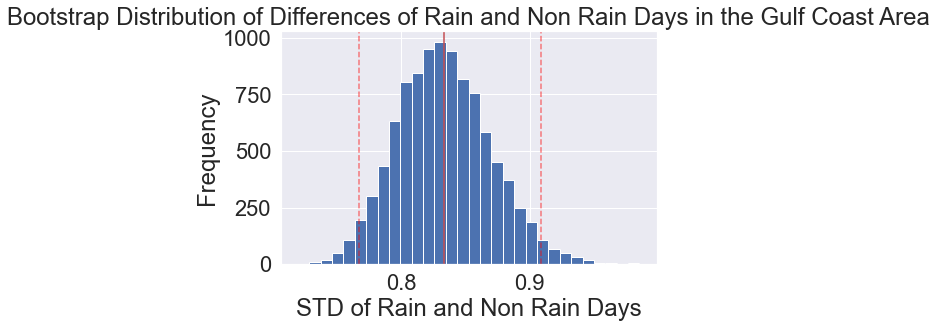

In [96]:
plt.hist(samples_std, bins=30, color='b')

plt.axvline(np.mean(samples_std), color='r', linestyle= '-')
plt.axvline(np.percentile(samples_std,(2.5)),  color='red', linestyle='--', alpha=0.5)
plt.axvline(np.percentile(samples_std,(97.5)), color='red', linestyle='--', alpha=0.5)

plt.title('Bootstrap Distribution of Differences of Rain and Non Rain Days in the Gulf Coast Area')
plt.xlabel('STD of Rain and Non Rain Days')
plt.ylabel('Frequency')

The observed difference of standard deviations falls within the 95% Confidence Interval

## Confidence interval and p-value

We'll perform a bootstrapped hypothesis test at the 5% significance level ( 𝛼=0.05 ) to calculate the p-value of the observed difference between rainy days and non rainy days.

In [97]:
bs_perm_rep = np.empty(N_rep)
diff_means = np.mean(rainfall) - np.mean(no_rainfall)

In [98]:
#Define a function to generate a permutation sample from two data sets (insured and uninsured)
def permutation_sample(data1, data2):

    # Concatenate the data sets: data
    data = np.concatenate((data1, data2))

    # Permute the concatenated array: permuted_data
    permuted_data = np.random.permutation(data)

    # Split the permuted array into two: perm_sample_1, perm_sample_2
    perm_sample_1 = permuted_data[:len(data1)]
    perm_sample_2 = permuted_data[len(data1):]

    return perm_sample_1, perm_sample_2

In [99]:
def draw_perm_reps(data_1, data_2, func, size=1):
    # Initialize array of replicates: perm_replicates
    perm_replicates = np.empty(size)

    for i in range(size):
        # Generate permutation sample
        perm_sample_1, perm_sample_2 = permutation_sample(data_1, data_2)

        # Compute the test statistic
        perm_replicates[i] = func(perm_sample_1, perm_sample_2)

    return perm_replicates

In [100]:
def diff_of_means(data_1, data_2):
    diff = np.mean(data_1) - np.mean(data_2)
    return diff

# Compute difference of mean insured and uninsured: empirical_diff_means
empirical_diff_means = diff_of_means(rainfall, no_rainfall)

# Draw 10,000 permutation replicates: perm_replicates
perm_replicates = draw_perm_reps(rainfall, no_rainfall, diff_of_means, size=N_rep)

# Compute permutation p-value: perm_p
perm_p = np.sum(perm_replicates >= empirical_diff_means) / len(perm_replicates)

#Compute p-value: p
p = np.sum(bs_perm_rep >= diff_means)/len(bs_perm_rep)


print('Perm p-value = ', perm_p)
print('P-value= ', p)

Perm p-value =  0.0
P-value=  0.7383


C:\Users\Jimsyd\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning:

invalid value encountered in greater_equal



***Null Hypothesis:*** Can we predict rain patterns for years to come based on past data from the Gulf Coast Area.

***Alternate Hypothesis:*** We will not be able to predict future rain patterns based off of past weather data for the Gulf Coast Area.

with the P-value from the bootstrap being 

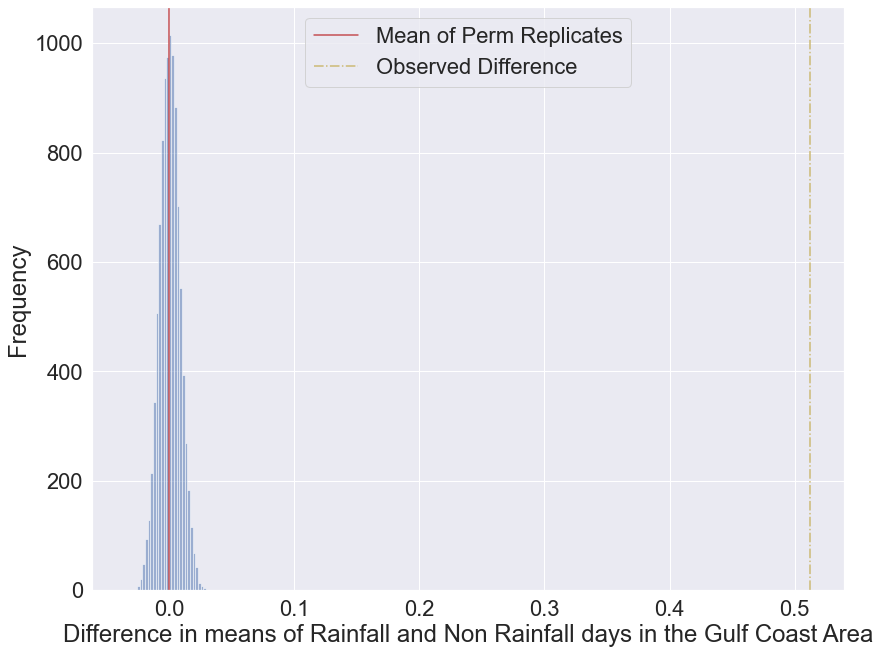

In [101]:
plt.figure(figsize=(12,10))
plt.hist(perm_replicates, alpha = 0.5, bins=30, color='b')
plt.axvline(np.mean(perm_replicates), color='r', linestyle='-', label='Mean of Perm Replicates')
plt.axvline(np.mean(diff_means), linestyle="-.", color='y', label='Observed Difference')
plt.xlabel('Difference in means of Rainfall and Non Rainfall days in the Gulf Coast Area')
plt.ylabel('Frequency')
plt.legend(loc = 'upper center')
plt.show()

In [102]:
a = df_time.loc[df_time['Rainfall(in)'] > 0]
b = df_time.loc[df_time['Rainfall(in)'] == 0]

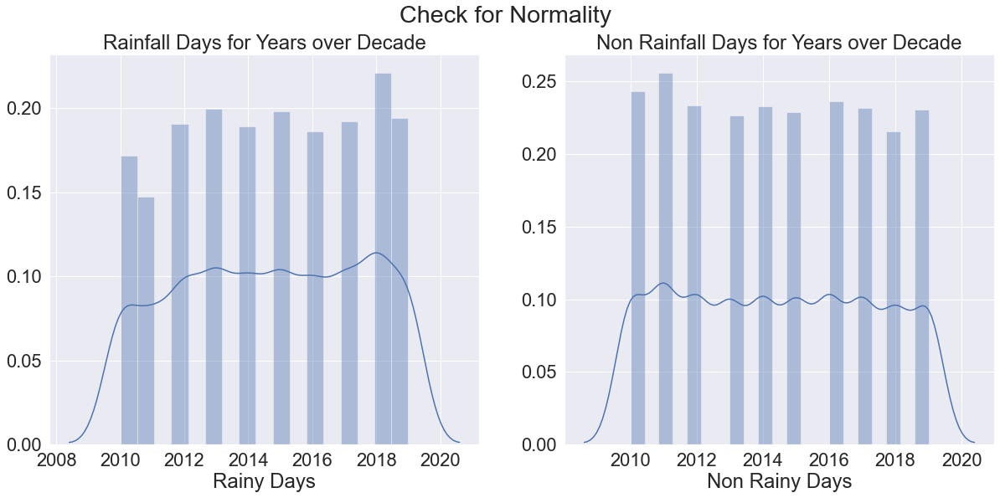

In [103]:
plt.subplots(1,2, figsize = (18,8))

plt.subplot(121)
sns.distplot(a.Year)
plt.xlabel('Rainy Days')
plt.title('Rainfall Days for Years over Decade')
plt.subplot(122)
sns.distplot(b.Year)
plt.xlabel('Non Rainy Days')
plt.title('Non Rainfall Days for Years over Decade')
plt.suptitle('Check for Normality')
plt.show()

## Regression Analysis

### Ordinary Least Squares (OLS) Estimation

In [109]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [110]:
#create a new dataframe to go with our regression analysis
df_rain = df_time.copy()
df_rain.rename(columns={'Dewpoint_temp(°F)': 'Dewpoint', 'Humidity(%)': 'Humidity', 'Sealevel_pressure(Hg)': 'Sealevel',
                        'Max_temp(°F)': 'MaxTemp', 'Min_temp(°F)': 'MinTemp', 'Average_temp(°F)': 'AverageTemp',
                        'Wind_speed(mph)': 'Windspeed', 'Rainfall(in)': 'Rainfall', 'Rain or Not': 'Rain_or_Not'}, inplace=True)
df_rain.head(5)

,City,datetime,Dewpoint,Humidity,Sealevel,MaxTemp,MinTemp,AverageTemp,Windspeed,Rainfall,Day,Week,Month_Name,Year,Rain_or_Not
30,Houston,2010-01-01,35.0,65.0,30.40,56.0,38.0,47.0,26.0,0.0,1,53,January,2010,0
59,Houston,2010-01-02,32.0,66.0,30.33,56.0,31.0,44.0,15.0,0.0,2,53,January,2010,0
88,Houston,2010-01-03,35.0,72.0,30.26,49.0,37.0,43.0,14.0,0.0,3,53,January,2010,0
119,Houston,2010-01-04,29.0,62.0,30.41,48.0,34.0,41.0,25.0,0.0,4,1,January,2010,0
148,Houston,2010-01-05,26.0,65.0,30.43,50.0,28.0,39.0,18.0,0.0,5,1,January,2010,0


In [111]:
rain_model = ols('Rainfall ~ Dewpoint + Windspeed', data=df_rain).fit()
print(rain_model.summary())

                            OLS Regression Results                            
Dep. Variable:               Rainfall   R-squared:                       0.124
Model:                            OLS   Adj. R-squared:                  0.124
Method:                 Least Squares   F-statistic:                     1292.
Date:                Mon, 01 Jun 2020   Prob (F-statistic):               0.00
Time:                        19:50:44   Log-Likelihood:                -12862.
No. Observations:               18243   AIC:                         2.573e+04
Df Residuals:                   18240   BIC:                         2.575e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.7149      0.020    -35.937      0.0

The p-value indicates that we can reject the null hypothesis that Windspeed has an effect on Rainfall.

The low r-squared indicates that our model does not have a significant variable.

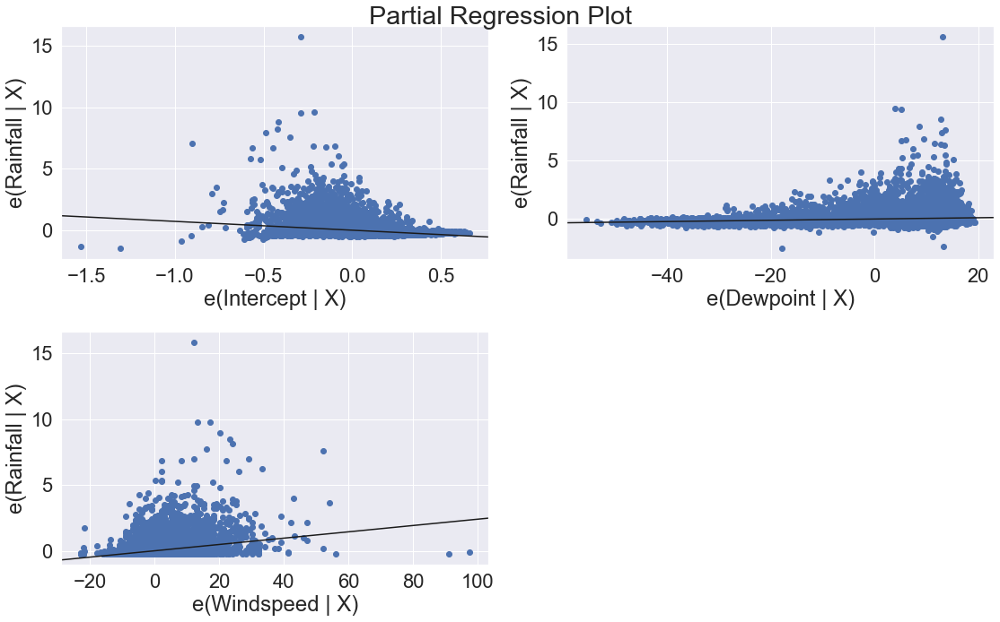

In [112]:
fig = plt.figure(figsize=(16,10))
fig = sm.graphics.plot_partregress_grid(rain_model, fig=fig)

The trend indicates that the predictor variables (Windspeed, Dewpoint) provides information about the response (Rainfall) and that the data points fall further from the regression line.

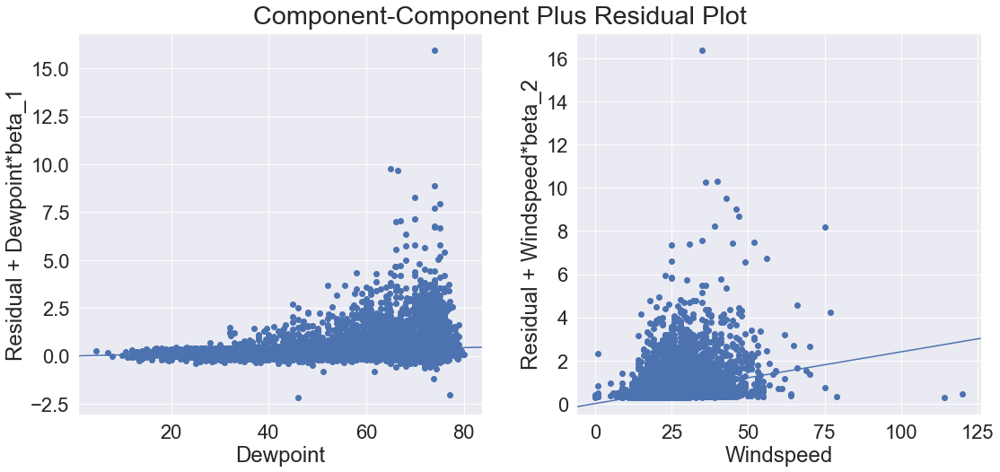

In [113]:
#Component-Copmonent plus residual plots (CCPR)
fig = plt.figure(figsize=(16, 14))
fig = sm.graphics.plot_ccpr_grid(rain_model, fig=fig)

Again we can see that our data points fall further from the regression line.

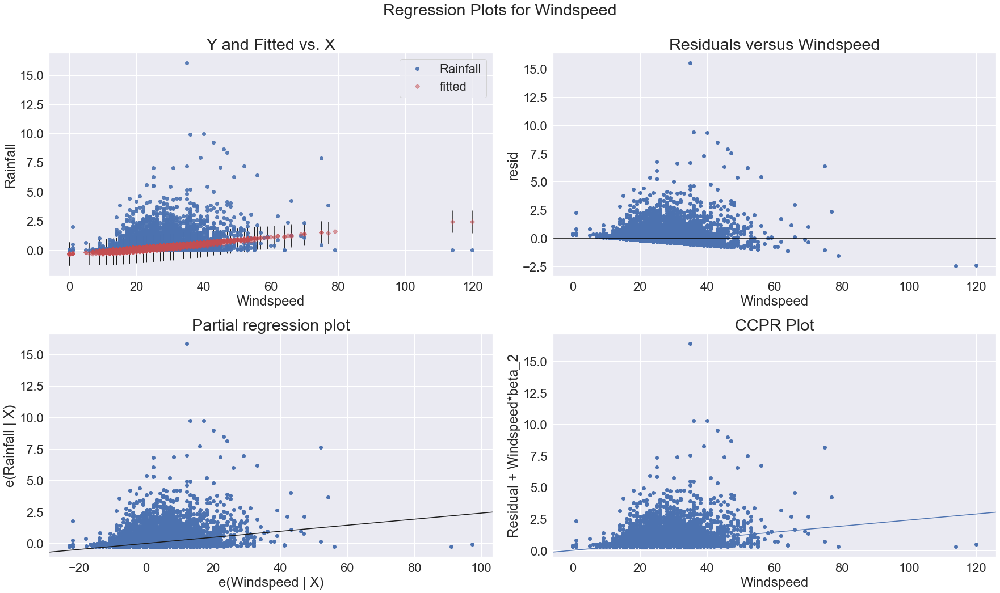

In [114]:
#regression plots
fig = plt.figure(figsize=(25,15))
fig = sm.graphics.plot_regress_exog(rain_model, 'Windspeed', fig=fig)

Using Windspeed as our single regressor, we used a plot_regress_exog function to check our model's assumptions.

In [115]:
#RSL estimation
endog = df_rain['Rainfall']
exog = sm.add_constant(df_rain['Dewpoint'])
mod = sm.RecursiveLS(endog, exog)
res = mod.fit()
print(res.summary())

C:\Users\Jimsyd\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\base\tsa_model.py:214: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



                           Statespace Model Results                           
Dep. Variable:               Rainfall   No. Observations:                18243
Model:                    RecursiveLS   Log Likelihood              -13875.922
Date:                Mon, 01 Jun 2020   R-squared:                       0.023
Time:                        19:50:54   AIC                          27755.844
Sample:                             0   BIC                          27771.467
                              - 18243   HQIC                         27760.978
Covariance Type:            nonrobust   Scale                            0.268
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.1811      0.017    -10.615      0.000      -0.215      -0.148
Dewpoint       0.0056      0.000     20.507      0.000       0.005       0.006
Ljung-Box (Q):                      652.46   Jarque-

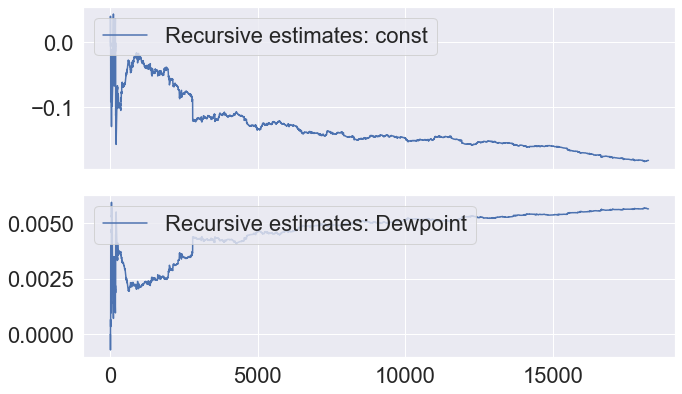

In [116]:
res.plot_recursive_coefficient(range(mod.k_exog), alpha=None, figsize=(10,6));

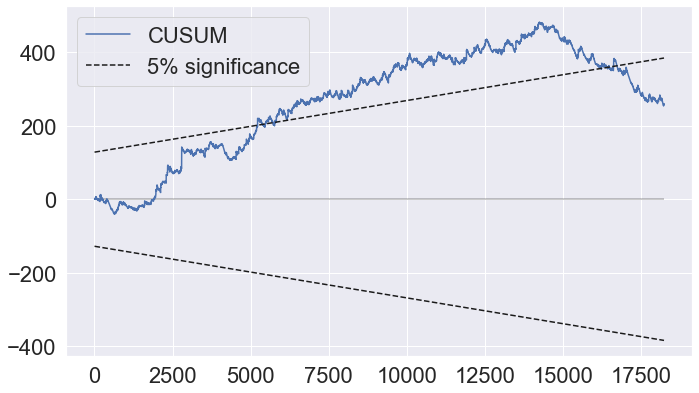

In [117]:
fig = res.plot_cusum(figsize=(10,6));

The CUSUM statistic moves outside of the 5% significance bands 